<a href="https://colab.research.google.com/github/CristinaMarsh/Learning_/blob/main/ODE/LatentSDE.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Installing Libraries**

borrow from https://github.com/vartikagpt10/Stock-Prediction-using-Neural-ODE-and-Neural-SDE

In [54]:
pip install git+https://github.com/google-research/torchsde.git

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
  Cloning https://github.com/google-research/torchsde.git to /tmp/pip-req-build-kivbfil0
  Running command git clone -q https://github.com/google-research/torchsde.git /tmp/pip-req-build-kivbfil0
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
    Preparing wheel metadata ... done


# **Importing Libraries**

In [55]:
import datetime as dt
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error
import math
import numpy as np
import pandas as pd
from sklearn.preprocessing import MinMaxScaler, StandardScaler

import argparse
import logging
import os
import time
import random
from collections import namedtuple
from typing import Optional, Union
import torch
import torch.nn.functional as F
import torch.nn.init as init
from torch import nn, optim, distributions
import torch.backends.cudnn as cudnn
import tqdm
from google.colab import files

import torchsde

# **Data Loading**

In [56]:
data = pd.read_csv('https://raw.githubusercontent.com/adityajaas/CS771A_term_project/master/RELIANCE.csv')
data.set_index(pd.Index(np.linspace(1, len(data.index), len(data.index), dtype = int)))
data['Date']= pd.to_datetime(data['Date']) 
data.head()

,Date,Symbol,Series,Prev Close,Open,High,Low,Last,Close,VWAP,Volume,Turnover,Trades,Deliverable Volume,%Deliverble
0,2015-01-01,RELIANCE,EQ,891.15,886.3,892.00,883.65,888.00,887.90,887.62,677439,6.013059e+13,16263,286377,0.4227
1,2015-01-02,RELIANCE,EQ,887.90,888.1,896.05,884.30,884.95,885.55,889.39,1675827,1.490461e+14,31269,1048543,0.6257
2,2015-01-05,RELIANCE,EQ,885.55,885.0,890.90,874.10,875.55,875.85,881.88,2309591,2.036781e+14,67035,1393132,0.6032
3,2015-01-06,RELIANCE,EQ,875.85,870.0,873.00,832.00,832.50,836.10,847.60,4258043,3.609133e+14,120767,2353273,0.5527
4,2015-01-07,RELIANCE,EQ,836.10,837.1,858.80,837.00,858.00,854.30,849.81,4736315,4.024972e+14,125939,2885468,0.6092


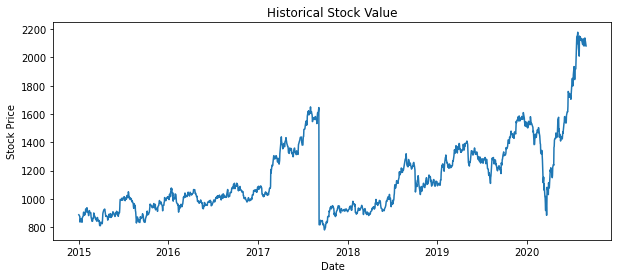

In [57]:
# Visualize the plot
plt.figure(figsize=(10,4))
plt.plot(data['Date'],data['Close'])
plt.title('Historical Stock Value')
plt.xlabel('Date')
plt.ylabel('Stock Price')
plt.show()

# **Data Cleaning and Splitting**

In [58]:
# Create new dataframe with only relevant columns
stk_data = pd.DataFrame(columns = ['Date', 'Open', 'High', 'Low', 'Close'])
stk_data['Date'] = data['Date']
stk_data['Open'] = data['Open']
stk_data['High'] = data['High']
stk_data['Low'] = data['Low']
stk_data['Close'] = data['Close']
stk_data.head()

,Date,Open,High,Low,Close
0,2015-01-01,886.3,892.00,883.65,887.90
1,2015-01-02,888.1,896.05,884.30,885.55
2,2015-01-05,885.0,890.90,874.10,875.85
3,2015-01-06,870.0,873.00,832.00,836.10
4,2015-01-07,837.1,858.80,837.00,854.30


In [59]:
# Define the training set
percent_training: float = 0.80
num_training_samples = int(np.ceil(percent_training*len(stk_data))) # number of training samples in int
training_set = stk_data.iloc[:num_training_samples, 4:5].values # Extract the Close values for training data

#Define the test data
num_testing_samples: int = len(stk_data) - num_training_samples # number of test samples in int 
testing_set = stk_data.iloc[-num_testing_samples:, 4:5].values # Extract the Close values for test data
print('Training set shape:', training_set.shape, '\n', 'Testing set shape:', testing_set.shape)

Training set shape: (1121, 1) 
 Testing set shape: (280, 1)


**Generting y_train, y_test, t_s**

In [60]:
# Scale training data
scaler = StandardScaler()
training_set_scaled = scaler.fit_transform(training_set) #2D (num_training_samples, 1)
testing_set_scaled = scaler.transform(testing_set) # 2D ndarray (num_testing_samples, 1)

In [61]:
sequence_length: int = 22 # Number of x_i for each y_i

x_train = np.array([training_set_scaled[i - sequence_length:i, 0] for i in range(sequence_length, len(training_set_scaled))]) 
x_train = np.reshape(x_train, (x_train.shape[0], x_train.shape[1])) # 3D training set (num_training_samples, sequence_length, 1) 

x_test = np.array([testing_set_scaled[i - sequence_length:i, 0] for i in range(sequence_length, len(testing_set_scaled))])
x_test = np.reshape(x_test, (x_test.shape[0], x_test.shape[1])) #3D test set (num_testing_samples, sequence_length, 1)

y_train = np.array([training_set_scaled[i, 0] for i in range(sequence_length, len(training_set_scaled))]) # 2D (num_training_samples, 1)
y_test = np.array([testing_set_scaled[i, 0] for i in range(sequence_length, len(testing_set_scaled))]) # 2D (num_testing_samples, 1)
y_test = np.reshape(y_test, (y_test.shape[0])) # 1D (num_testing_samples, )

print('x_train shape:', x_train.shape, '\n', 'x_test shape:', x_test.shape, '\n', 'y_train shape:', y_train.shape, '\n', 'y_test shape:', y_test.shape)

ts_  = np.arange(0, y_train.shape[0])
ts_ext_ = np.arange(y_train.shape[0], y_train.shape[0] + y_test.shape[0])
ts_full_ = np.arange(0, y_train.shape[0] + y_test.shape[0])

# Since each year has 252 trading days on average
ts_ = ts_/252; ts_ext_ = ts_ext_/252; ts_full_ = ts_full_/252 # ts_[-1] = 4.44444, ts_ext_[-1] : 5.5555

print('ts_ shape:', ts_.shape, '\n', 'ts_ext_ shape:', ts_ext_.shape, '\n', 'ts_full_ shape:', ts_full_.shape)

x_train shape: (1099, 22) 
 x_test shape: (258, 22) 
 y_train shape: (1099,) 
 y_test shape: (258,)
ts_ shape: (1099,) 
 ts_ext_ shape: (258,) 
 ts_full_ shape: (1357,)


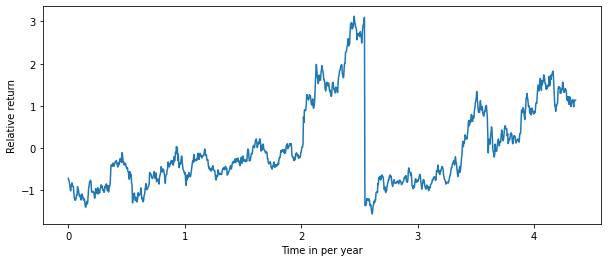

In [62]:
plt.figure(figsize = (10,4))
plt.plot(ts_, y_train)
plt.xlabel('Time in per year')
plt.ylabel('Relative return')
plt.show()

In [63]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
xs_ = x_train
ys_ = y_train
xs_ext_ = x_test
ys_ext_ = y_test
xs = torch.tensor(xs_).float().to(device)
ys = torch.tensor(ys_).float().to(device)
# ys = ys.view(y_train.shape[0],1)
xs_ext = torch.tensor(xs_ext_).float().to(device)
ys_ext = torch.tensor(ys_ext_).float().to(device)

ts = torch.tensor(ts_).float().to(device)
ts = ts.view(ts_.shape[0],1)
ts_ext = torch.tensor(ts_ext_).float().to(device)
ts_ext = ts_ext.view(ts_ext_.shape[0],1)
ts_vis = ts_ext


In [64]:
Data = namedtuple('Data', ['ts_', 'ts_ext_', 'ts_vis_', 'ts', 'ts_ext', 'ts_vis', 'ys', 'ys_','ys_ext_'])

# **SDE Definition**

In [65]:
__all__ = ['SDENet']

class Drift(nn.Module):
    def __init__(self):
        super(Drift, self).__init__()
        self.fc = nn.Linear(50, 50)
        self.relu = nn.ReLU(inplace=True)
    def forward(self, t, x):
        out = self.relu(self.fc(x))
        return out    



class Diffusion(nn.Module):
    def __init__(self):
        super(Diffusion, self).__init__()
        self.relu = nn.ReLU(inplace=True)
        self.fc1 = nn.Linear(50, 100)
        self.fc2 = nn.Linear(100, 1)
    def forward(self, t, x):
        out = self.relu(self.fc1(x))
        out = self.fc2(out)
        out = torch.relu(out)
        return out


    
class SDENet(nn.Module):
    def __init__(self, layer_depth):
        super(SDENet, self).__init__()
        self.layer_depth = layer_depth
        self.downsampling_layers = nn.Linear(sequence_length, 50)
        self.drift = Drift()
        self.diffusion = Diffusion()
        self.fc_layers = nn.Sequential(nn.ReLU(inplace=True), nn.Linear(50, 2))
        self.deltat = 1./self.layer_depth
        self.sigma = 0.5
    def forward(self, x, training_diffusion=False):
        out = self.downsampling_layers(x)
        if not training_diffusion:
            t = 0
            diffusion_term = self.sigma*self.diffusion(t, out)
            for i in range(self.layer_depth):
                t = (float(i))/self.layer_depth
                out = out + self.drift(t, out)*self.deltat + diffusion_term*math.sqrt(self.deltat)*torch.randn_like(out).to(x)

            final_out = self.fc_layers(out) 
            mean = final_out[:,0]
            sigma = F.softplus(final_out[:,1])+1e-3
            return mean, sigma
            
        else:
            t = 0
            final_out = self.diffusion(t, out.detach())  
            return final_out

def test():
    model = SDENet(layer_depth=6)
    return model  
 
def count_parameters(model):
    return sum(p.numel() for p in model.parameters() if p.requires_grad)

if __name__ == '__main__':
    model = test()
    num_params = count_parameters(model)
    print(num_params)

9003


# **SDE_Regression**

## **DataSet loading**

In [73]:
X_train = torch.from_numpy(x_train).float()
X_test = torch.from_numpy(x_test).float()
Y_train = torch.from_numpy(y_train).float().reshape(-1,1)
Y_test = torch.from_numpy(y_test).float().reshape(-1,1)
print('X_train.shape:', X_train.shape, '\nX_test.shape:', X_test.shape, '\nY_train.shape:', Y_train.shape, '\nY_test.shape:', Y_test.shape)

X_train.shape: torch.Size([1099, 22]) 
X_test.shape: torch.Size([258, 22]) 
Y_train.shape: torch.Size([1099, 1]) 
Y_test.shape: torch.Size([258, 1])


In [80]:
X_train

tensor([[-0.9787, -0.9913, -1.0435,  ..., -0.7554, -0.8315, -0.8703],
        [-0.9913, -1.0435, -1.2575,  ..., -0.8315, -0.8703, -0.7112],
        [-1.0435, -1.2575, -1.1595,  ..., -0.8703, -0.7112, -0.7586],
        ...,
        [ 1.3422,  1.3960,  1.4121,  ...,  1.0419,  0.9810,  1.1320],
        [ 1.3960,  1.4121,  1.3858,  ...,  0.9810,  1.1320,  1.1253],
        [ 1.4121,  1.3858,  1.3336,  ...,  1.1320,  1.1253,  1.1398]])

## **Arguments**

In [67]:
from __future__ import print_function

parser = argparse.ArgumentParser(description='PyTorch SDENet Training')
parser.add_argument('--epochs', type=int, default=200, help='number of epochs to train')
parser.add_argument('--lr', default=1e-4, type=float, help='learning rate')
parser.add_argument('--lr2', default=0.01, type=float, help='learning rate')
parser.add_argument('--gpu', type=int, default=0)
parser.add_argument('--seed', type=float, default=0)
parser.add_argument('--droprate', type=float, default=0.1, help='learning rate decay')
parser.add_argument('--decreasing_lr', default=[20], nargs='+', help='decreasing strategy')
parser.add_argument('--decreasing_lr2', default=[], nargs='+', help='decreasing strategy')

args = parser.parse_args([])
print(args)
device = torch.device('cuda:' + str(args.gpu) if torch.cuda.is_available() else 'cpu')

batch_size = y_train.squeeze().shape[0]
Iter = 50
Iter_test = 1

Namespace(decreasing_lr=[20], decreasing_lr2=[], droprate=0.1, epochs=200, gpu=0, lr=0.0001, lr2=0.01, seed=0)


In [85]:
Y_train.shape

torch.Size([1099, 1])

## **Model**

In [94]:
from sklearn.metrics import mean_squared_error
net = SDENet(25)
net = net.to(device)

criterion = nn.MSELoss()

real_label = 0
fake_label = 1

optimizer_F = optim.SGD([ {'params': net.downsampling_layers.parameters()}, {'params': net.drift.parameters()},
{'params': net.fc_layers.parameters()}], lr=args.lr, momentum=0.9, weight_decay=5e-4)

optimizer_G = optim.SGD([ {'params': net.diffusion.parameters()}], lr=args.lr2, momentum=0.9, weight_decay=5e-4)

def nll_loss(y, mean, sigma):
    loss = torch.mean(torch.log(sigma**2)+(y-mean)**2/(sigma**2))
    return loss
def mse(y, mean):
    loss = torch.mean((y-mean)**2)
    return loss

# Training
def train(epoch):
    print('\nEpoch: %d' % epoch)
    net.train()
    if epoch == 0:
        net.sigma = 0.1
    if epoch == 30:
        net.sigma = 0.5
    train_loss = 0
    train_loss_in = 0
    train_loss_out = 0
    total = 0
    for iternum in range(Iter):
        inputs, targets = X_train, Y_train
        # print(inputs.shape)
        inputs
        targets = targets.reshape(-1,1)
        inputs, targets = inputs.to(device), targets.to(device)
        
        optimizer_F.zero_grad()
        mean, sigma = net(inputs)
        mean = mean.reshape(-1,1) #BUG
        loss = nll_loss(targets, mean, sigma)
        # loss = criterion(targets, mean)
        loss.backward()
        nn.utils.clip_grad_norm_(net.parameters(), 100.)
        optimizer_F.step()
        train_loss += loss.item()

        label = torch.full((batch_size,1), real_label, device=device)
        optimizer_G.zero_grad()
        predict_in = net(inputs, training_diffusion=True)
        loss_in = criterion(predict_in, label.float())
        loss_in.backward()
        label.fill_(fake_label)

        inputs_out = 2 * torch.randn(batch_size, sequence_length, device = device) + inputs
        predict_out = net(inputs_out, training_diffusion=True)
        loss_out = criterion(predict_out, label.float())
        
        loss_out.backward()
        train_loss_out += loss_out.item()
        train_loss_in += loss_in.item()
        optimizer_G.step()
    plt.figure(figsize = (8, 4))
    plt.plot(ts_, scaler.inverse_transform(mean.cpu().detach().numpy()))
    plt.plot(ts_, scaler.inverse_transform(targets.cpu().detach().numpy()))
    plt.ylim(750,1700)
    img_path = os.path.join('/content/output/', f'train_{epoch}.png')
    plt.savefig(img_path, dpi = 300)
    plt.show()
    print('Train epoch:{} \tLoss: {:.6f}| Loss_in: {:.6f}| Loss_out: {:.6f}'.format(epoch, train_loss/Iter, train_loss_in/Iter, train_loss_out/Iter))
    return mean_squared_error(Y_train.numpy(), mean.cpu().detach().numpy())

# Testing
def test(epoch):
    net.eval()
    test_loss = 0
    total = 0
    with torch.no_grad():
        for iternum in range(Iter_test):
            inputs, targets = X_test, Y_test
            inputs, targets = inputs.to(device), targets.to(device)
            current_mean = 0
            for i in range(10):
                mean, sigma = net(inputs)
                mean = mean.reshape(-1,1)
                current_mean = current_mean + mean
            current_mean = current_mean/10
            loss = mse(targets, current_mean)
            plt.figure(figsize = (8, 4))
            plt.plot(ts_ext_, scaler.inverse_transform(current_mean.cpu().detach().numpy()))
            plt.plot(ts_ext_, scaler.inverse_transform(targets.cpu().detach().numpy()))
            plt.ylim(800,2300)
            img_path = os.path.join('/content/output/', f'test_{epoch}.png')
            plt.savefig(img_path, dpi = 300)
            plt.show()
            test_loss += loss.item()
    
    print('Test epoch:{} \tLoss: {:.6f}'.format(epoch, np.sqrt(test_loss/Iter_test)))
    return mean_squared_error(Y_test.numpy(), current_mean.cpu().detach().numpy())



Epoch: 50


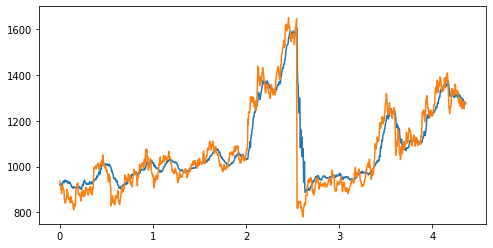

Train epoch:50 	Loss: -0.227544| Loss_in: 0.004562| Loss_out: 0.036260


0.15410666

In [89]:
# Training
epoch = 50
print('\nEpoch: %d' % epoch)
net.train()
if epoch == 0:
    net.sigma = 0.1
if epoch == 30:
    net.sigma = 0.5
train_loss = 0
train_loss_in = 0
train_loss_out = 0
total = 0
for iternum in range(Iter):
    inputs, targets = X_train, Y_train
    # print(inputs.shape)
    inputs
    targets = targets.reshape(-1,1)
    inputs, targets = inputs.to(device), targets.to(device)
    
    optimizer_F.zero_grad()
    mean, sigma = net(inputs)
    mean = mean.reshape(-1,1)
    loss = nll_loss(targets, mean, sigma)
    # loss = criterion(targets, mean)
    loss.backward()
    nn.utils.clip_grad_norm_(net.parameters(), 100.)
    optimizer_F.step()
    train_loss += loss.item()

    label = torch.full((batch_size,1), real_label, device=device)
    optimizer_G.zero_grad()
    predict_in = net(inputs, training_diffusion=True)
    loss_in = criterion(predict_in, label.float())
    loss_in.backward()
    label.fill_(fake_label)

    inputs_out = 2 * torch.randn(batch_size, sequence_length, device = device) + inputs
    predict_out = net(inputs_out, training_diffusion=True)
    loss_out = criterion(predict_out, label.float())
    
    loss_out.backward()
    train_loss_out += loss_out.item()
    train_loss_in += loss_in.item()
    optimizer_G.step()
plt.figure(figsize = (8, 4))
plt.plot(ts_, scaler.inverse_transform(mean.cpu().detach().numpy()))
plt.plot(ts_, scaler.inverse_transform(targets.cpu().detach().numpy()))
plt.ylim(750,1700)
img_path = os.path.join('/content/output/', f'train_{epoch}.png')
plt.savefig(img_path, dpi = 300)
plt.show()
print('Train epoch:{} \tLoss: {:.6f}| Loss_in: {:.6f}| Loss_out: {:.6f}'.format(epoch, train_loss/Iter, train_loss_in/Iter, train_loss_out/Iter))
mean_squared_error(Y_train.numpy(), mean.cpu().detach().numpy())

## **Run Epochs**


Epoch: 1


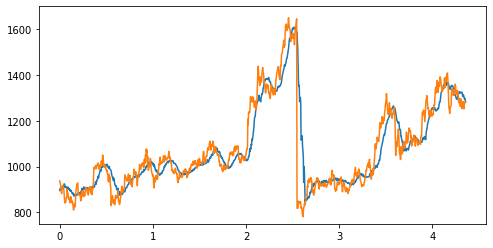

Train epoch:1 	Loss: 0.248842| Loss_in: 0.038658| Loss_out: 0.093106


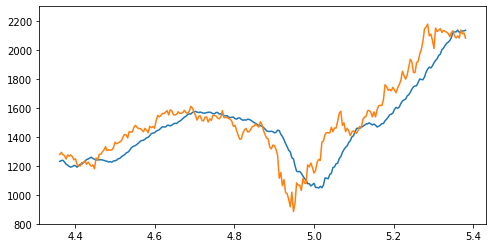

Test epoch:1 	Loss: 0.738706

Epoch: 2


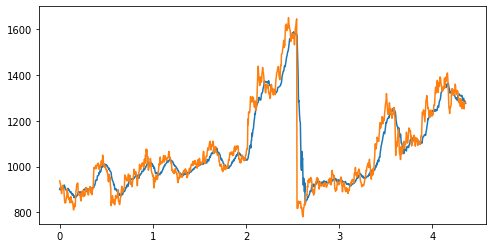

Train epoch:2 	Loss: -0.571983| Loss_in: 0.006975| Loss_out: 0.044387


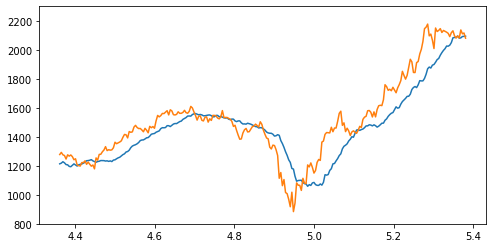

Test epoch:2 	Loss: 0.690275

Epoch: 3


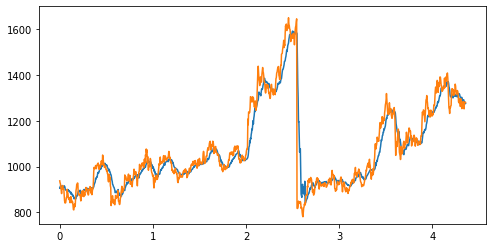

Train epoch:3 	Loss: -0.898881| Loss_in: 0.005823| Loss_out: 0.039471


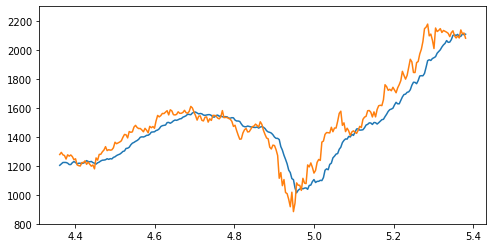

Test epoch:3 	Loss: 0.574196

Epoch: 4


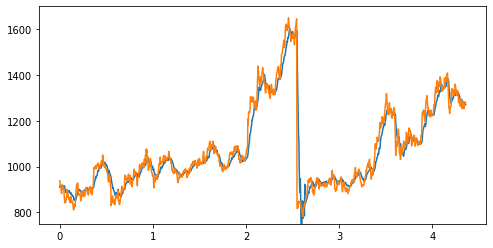

Train epoch:4 	Loss: -1.201021| Loss_in: 0.005059| Loss_out: 0.036464


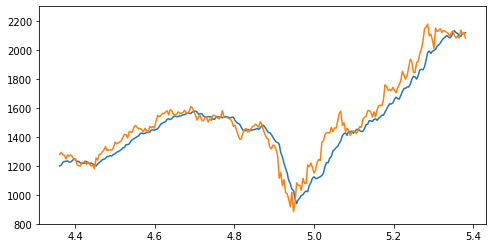

Test epoch:4 	Loss: 0.457431

Epoch: 5


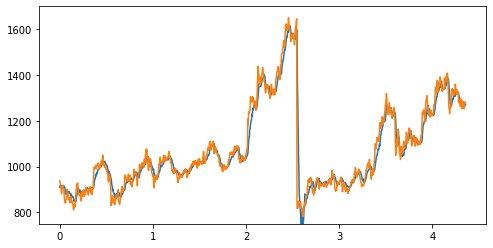

Train epoch:5 	Loss: -1.434989| Loss_in: 0.004576| Loss_out: 0.034466


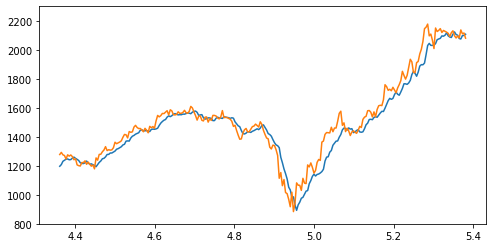

Test epoch:5 	Loss: 0.375134

Epoch: 6


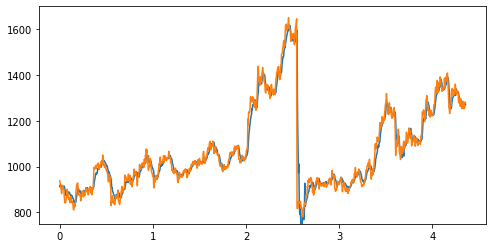

Train epoch:6 	Loss: -1.595921| Loss_in: 0.004286| Loss_out: 0.033364


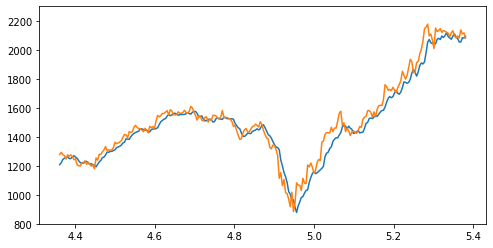

Test epoch:6 	Loss: 0.338702

Epoch: 7


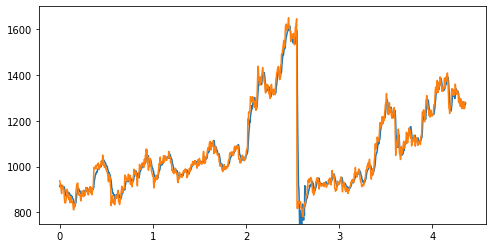

Train epoch:7 	Loss: -1.705029| Loss_in: 0.004014| Loss_out: 0.032344


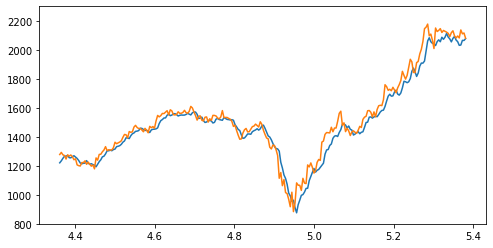

Test epoch:7 	Loss: 0.319220

Epoch: 8


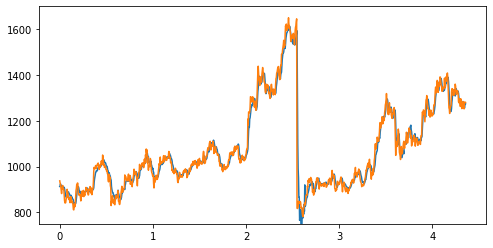

Train epoch:8 	Loss: -1.802967| Loss_in: 0.003951| Loss_out: 0.031873


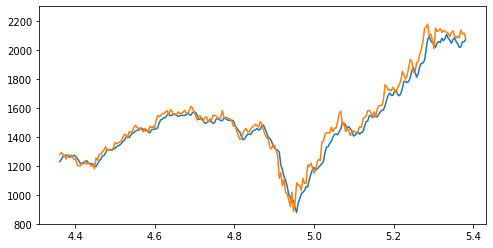

Test epoch:8 	Loss: 0.306663

Epoch: 9


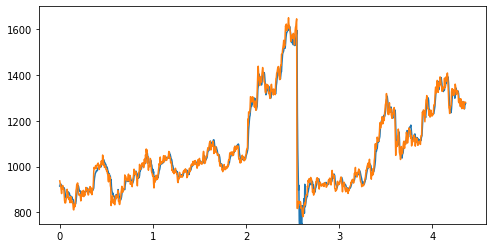

Train epoch:9 	Loss: -1.883823| Loss_in: 0.003757| Loss_out: 0.030768


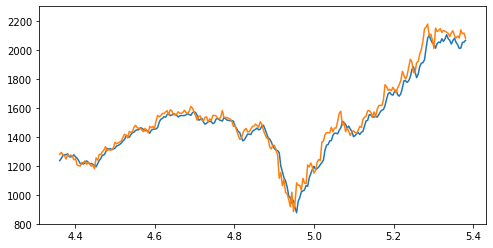

Test epoch:9 	Loss: 0.297002

Epoch: 10


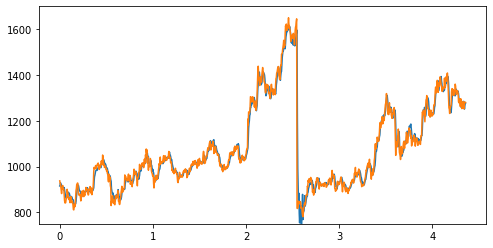

Train epoch:10 	Loss: -1.953344| Loss_in: 0.003672| Loss_out: 0.029945


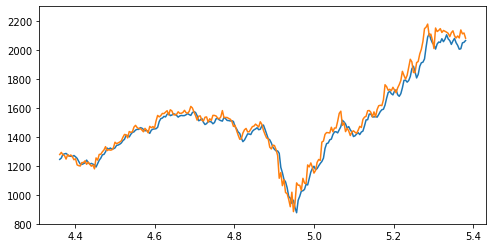

Test epoch:10 	Loss: 0.288470

Epoch: 11


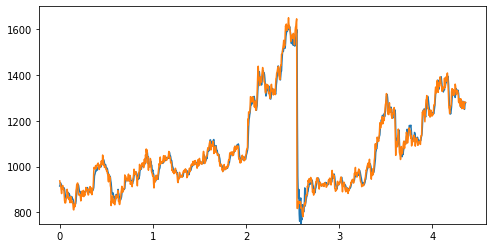

Train epoch:11 	Loss: -2.017197| Loss_in: 0.003588| Loss_out: 0.029878


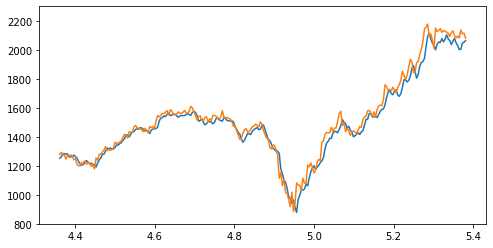

Test epoch:11 	Loss: 0.283662

Epoch: 12


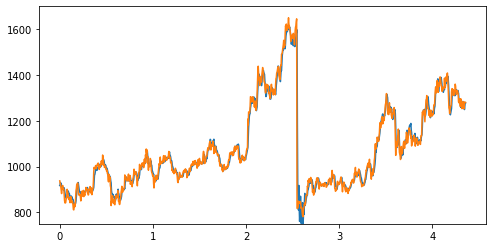

Train epoch:12 	Loss: -2.074199| Loss_in: 0.003532| Loss_out: 0.029553


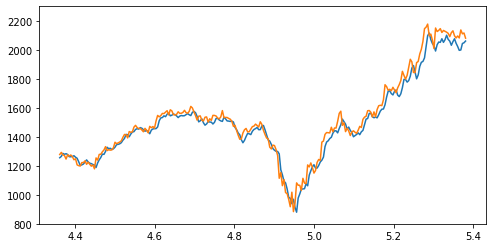

Test epoch:12 	Loss: 0.281775

Epoch: 13


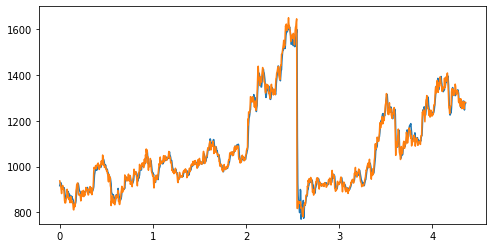

Train epoch:13 	Loss: -2.131276| Loss_in: 0.003351| Loss_out: 0.028642


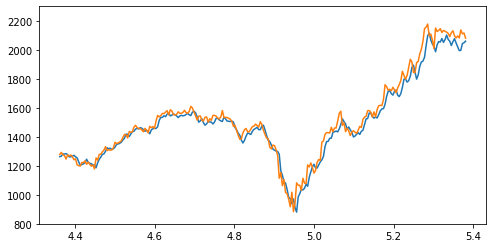

Test epoch:13 	Loss: 0.280764

Epoch: 14


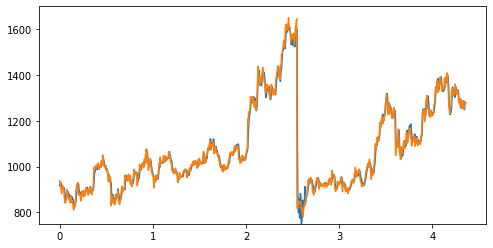

Train epoch:14 	Loss: -2.182617| Loss_in: 0.003263| Loss_out: 0.028306


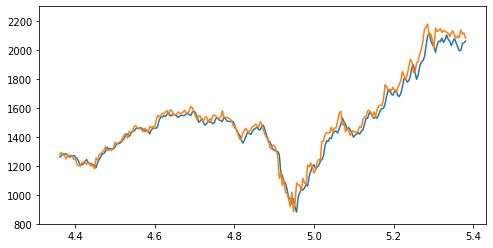

Test epoch:14 	Loss: 0.277714

Epoch: 15


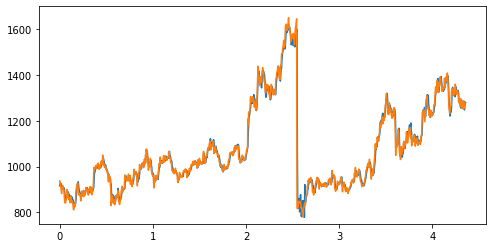

Train epoch:15 	Loss: -2.229574| Loss_in: 0.003173| Loss_out: 0.028205


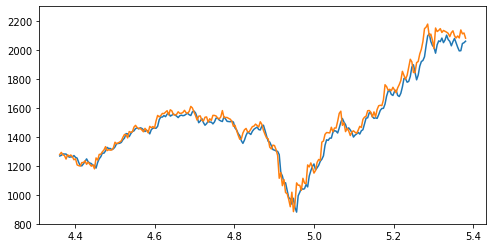

Test epoch:15 	Loss: 0.277443

Epoch: 16


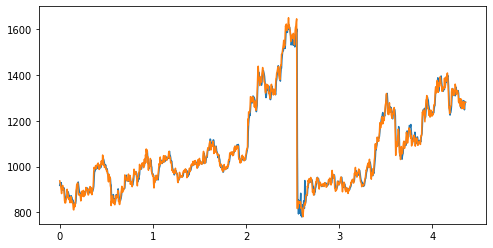

Train epoch:16 	Loss: -2.272701| Loss_in: 0.003181| Loss_out: 0.027611


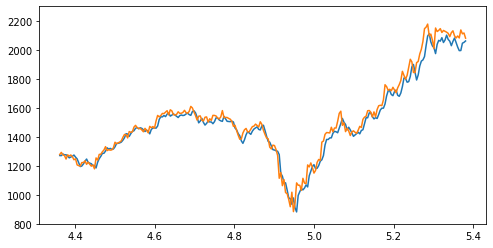

Test epoch:16 	Loss: 0.275330

Epoch: 17


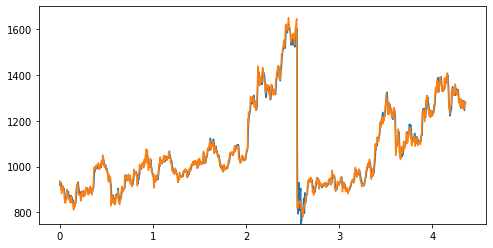

Train epoch:17 	Loss: -2.318535| Loss_in: 0.003068| Loss_out: 0.027243


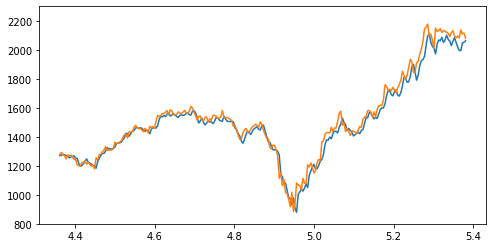

Test epoch:17 	Loss: 0.273814

Epoch: 18


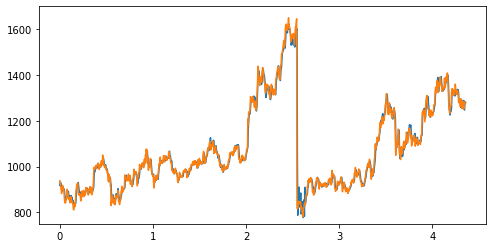

Train epoch:18 	Loss: -2.358789| Loss_in: 0.003020| Loss_out: 0.027004


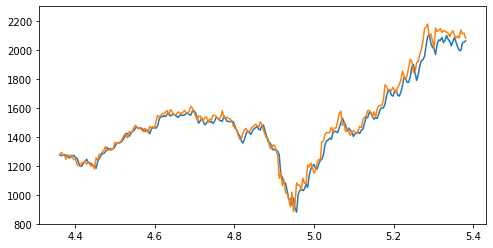

Test epoch:18 	Loss: 0.273852

Epoch: 19


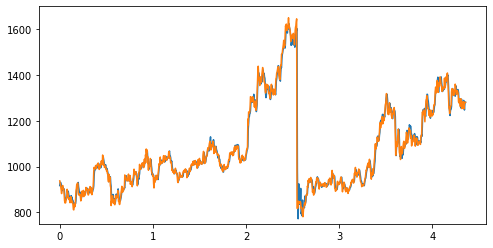

Train epoch:19 	Loss: -2.393892| Loss_in: 0.003009| Loss_out: 0.026703


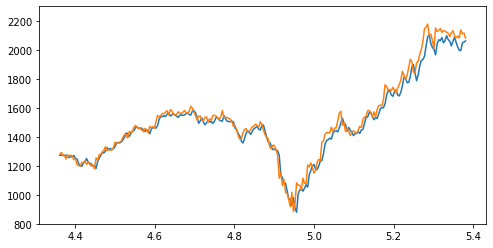

Test epoch:19 	Loss: 0.273759

Epoch: 20


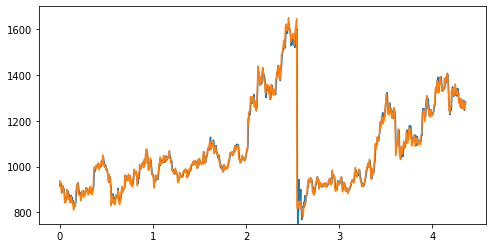

Train epoch:20 	Loss: -2.428831| Loss_in: 0.002949| Loss_out: 0.026622


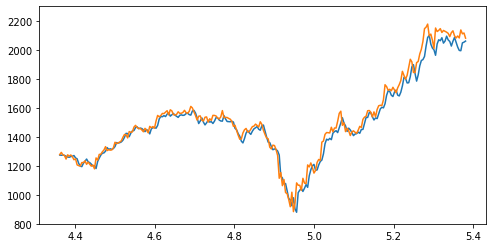

Test epoch:20 	Loss: 0.275328

Epoch: 21


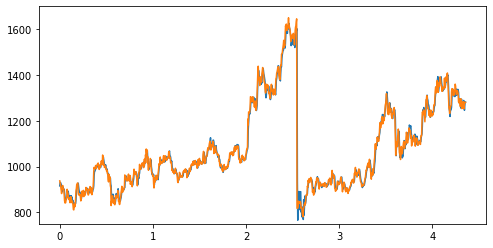

Train epoch:21 	Loss: -2.445981| Loss_in: 0.002915| Loss_out: 0.025757


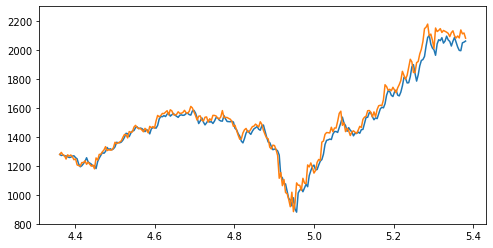

Test epoch:21 	Loss: 0.275064

Epoch: 22


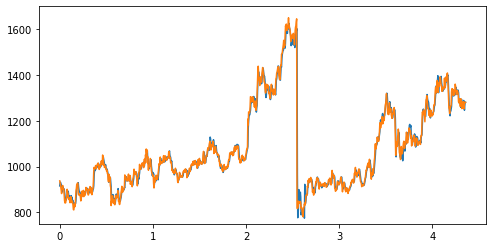

Train epoch:22 	Loss: -2.448882| Loss_in: 0.002856| Loss_out: 0.025651


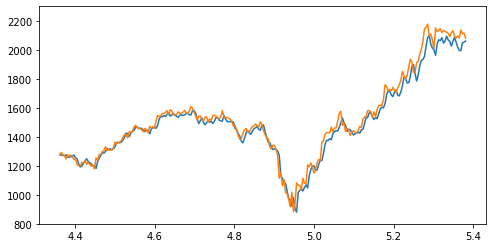

Test epoch:22 	Loss: 0.274819

Epoch: 23


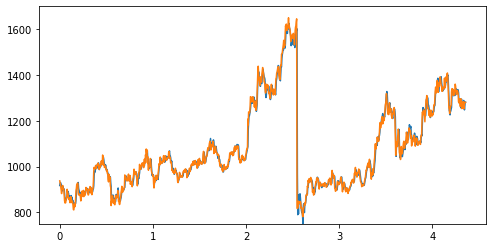

Train epoch:23 	Loss: -2.451358| Loss_in: 0.002821| Loss_out: 0.024877


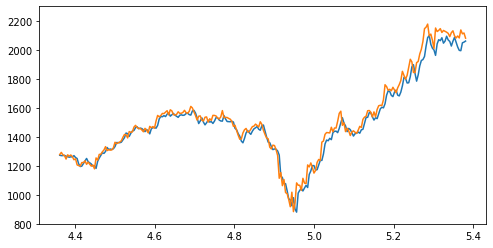

Test epoch:23 	Loss: 0.275533

Epoch: 24


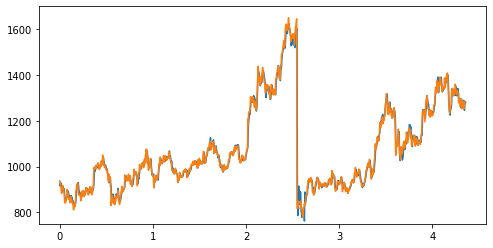

Train epoch:24 	Loss: -2.453019| Loss_in: 0.002789| Loss_out: 0.025050


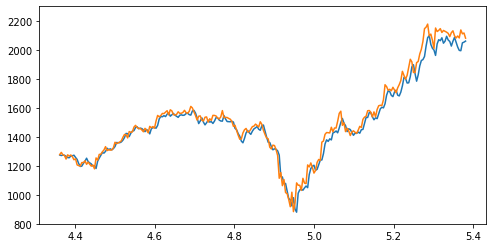

Test epoch:24 	Loss: 0.275295

Epoch: 25


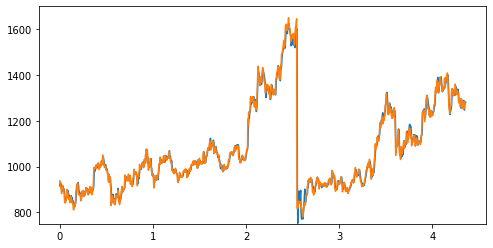

Train epoch:25 	Loss: -2.459674| Loss_in: 0.002743| Loss_out: 0.024783


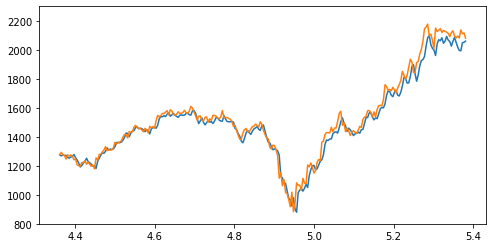

Test epoch:25 	Loss: 0.276019

Epoch: 26


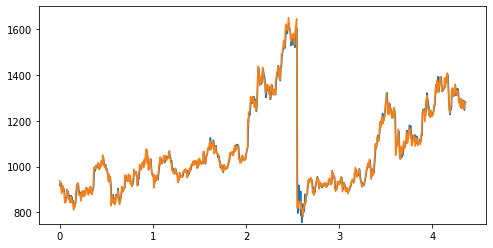

Train epoch:26 	Loss: -2.459888| Loss_in: 0.002754| Loss_out: 0.024736


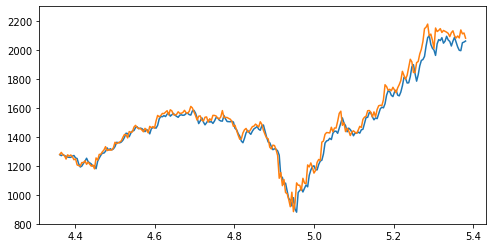

Test epoch:26 	Loss: 0.275280

Epoch: 27


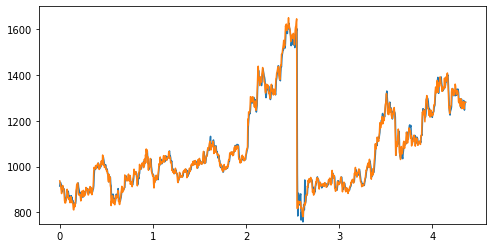

Train epoch:27 	Loss: -2.465583| Loss_in: 0.002679| Loss_out: 0.024303


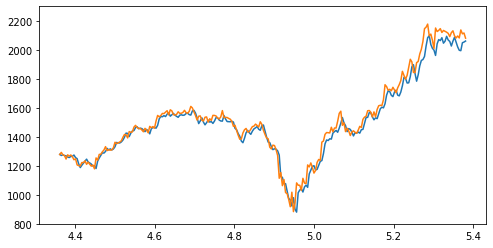

Test epoch:27 	Loss: 0.274952

Epoch: 28


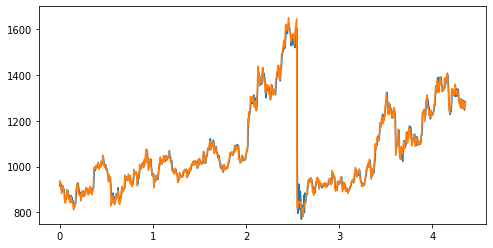

Train epoch:28 	Loss: -2.465652| Loss_in: 0.002651| Loss_out: 0.024122


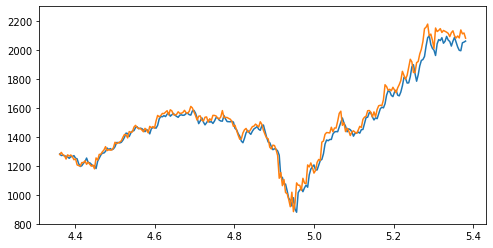

Test epoch:28 	Loss: 0.274760

Epoch: 29


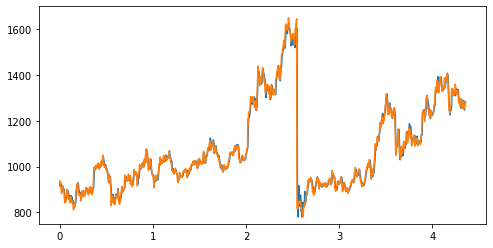

Train epoch:29 	Loss: -2.469002| Loss_in: 0.002609| Loss_out: 0.023978


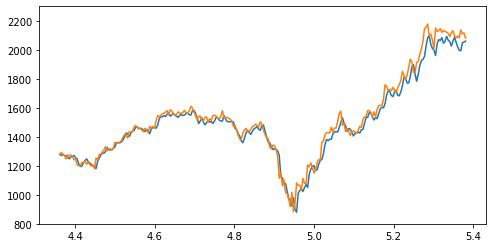

Test epoch:29 	Loss: 0.275047

Epoch: 30


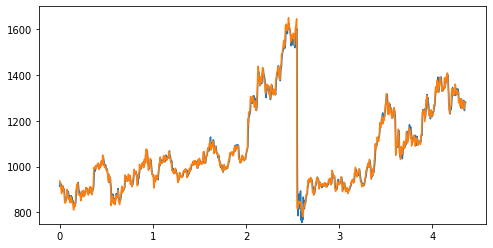

Train epoch:30 	Loss: -2.472513| Loss_in: 0.002561| Loss_out: 0.023804


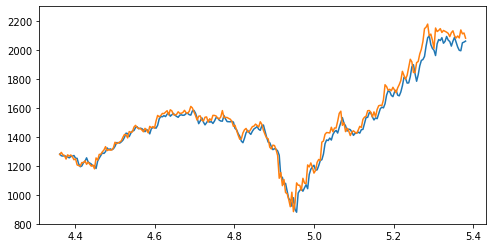

Test epoch:30 	Loss: 0.276074

Epoch: 31


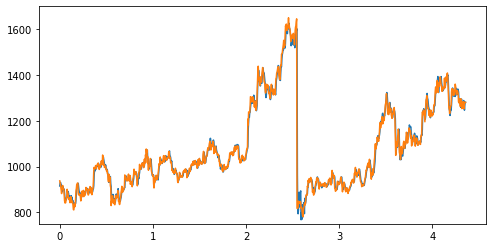

Train epoch:31 	Loss: -2.476361| Loss_in: 0.002581| Loss_out: 0.023956


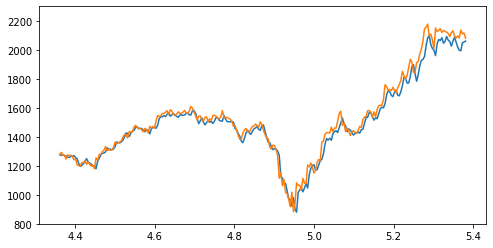

Test epoch:31 	Loss: 0.275076

Epoch: 32


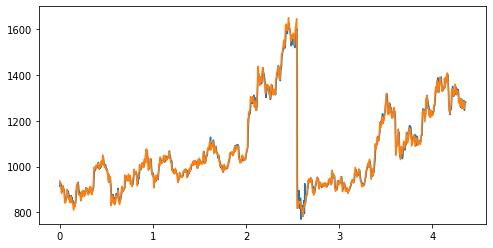

Train epoch:32 	Loss: -2.480513| Loss_in: 0.002467| Loss_out: 0.023159


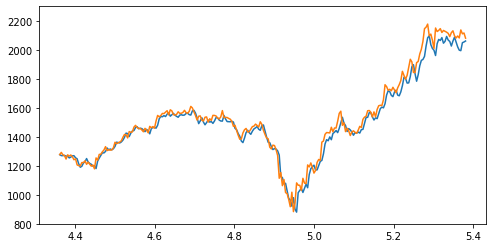

Test epoch:32 	Loss: 0.275337

Epoch: 33


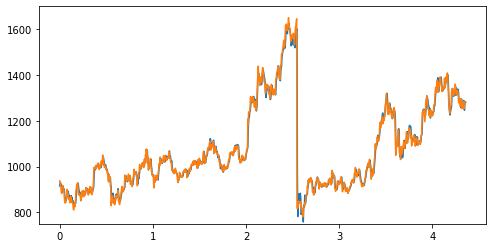

Train epoch:33 	Loss: -2.482177| Loss_in: 0.002494| Loss_out: 0.023171


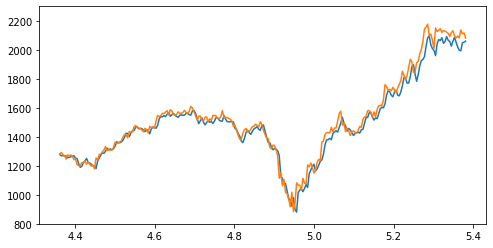

Test epoch:33 	Loss: 0.275618

Epoch: 34


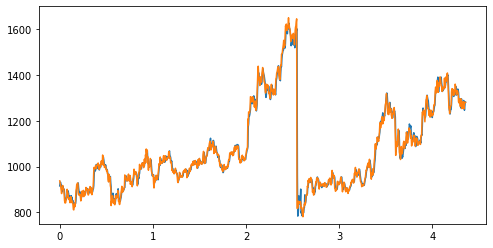

Train epoch:34 	Loss: -2.485238| Loss_in: 0.002446| Loss_out: 0.022985


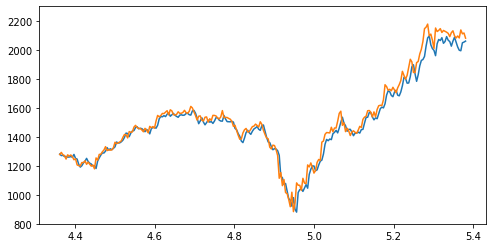

Test epoch:34 	Loss: 0.275826

Epoch: 35


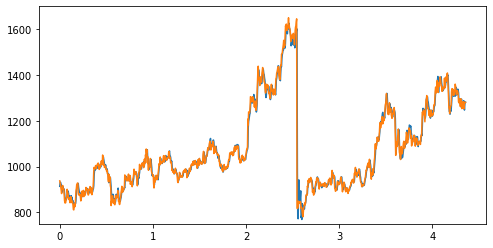

Train epoch:35 	Loss: -2.487382| Loss_in: 0.002453| Loss_out: 0.022644


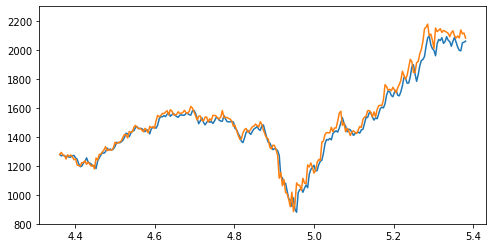

Test epoch:35 	Loss: 0.276208

Epoch: 36


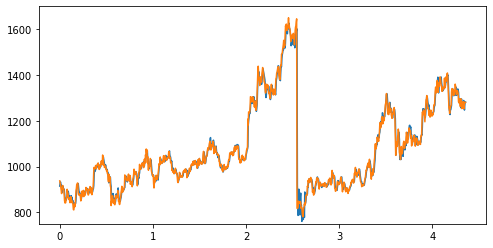

Train epoch:36 	Loss: -2.489404| Loss_in: 0.002422| Loss_out: 0.022517


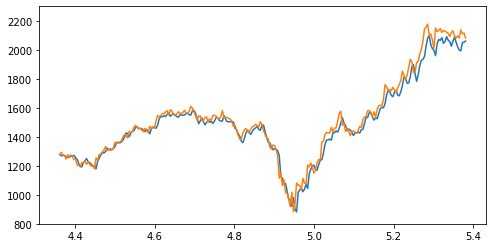

Test epoch:36 	Loss: 0.275656

Epoch: 37


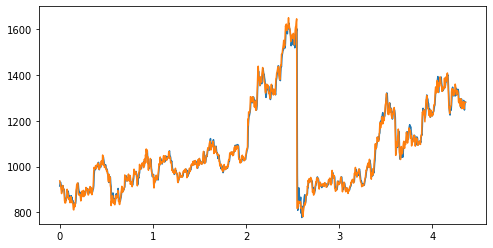

Train epoch:37 	Loss: -2.492600| Loss_in: 0.002442| Loss_out: 0.022248


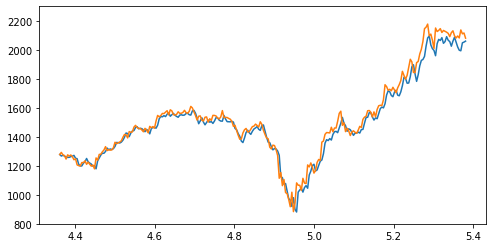

Test epoch:37 	Loss: 0.276515

Epoch: 38


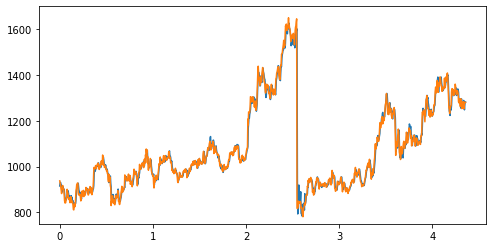

Train epoch:38 	Loss: -2.495811| Loss_in: 0.002405| Loss_out: 0.022186


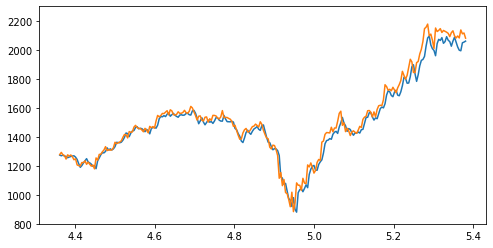

Test epoch:38 	Loss: 0.275137

Epoch: 39


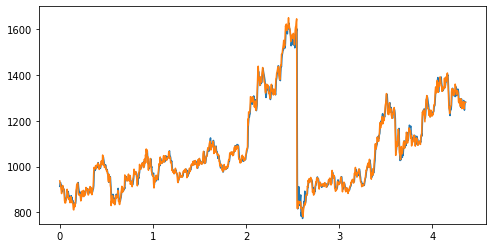

Train epoch:39 	Loss: -2.497470| Loss_in: 0.002365| Loss_out: 0.021718


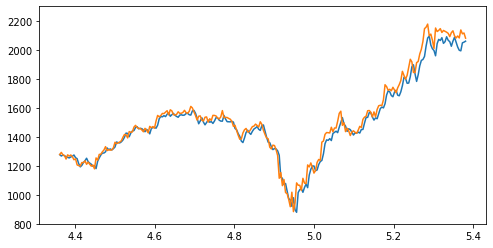

Test epoch:39 	Loss: 0.276378

Epoch: 40


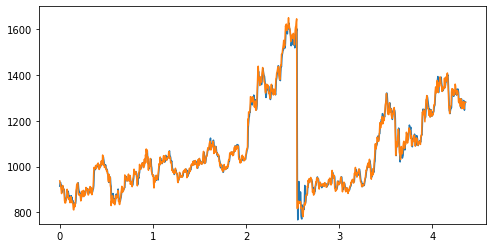

Train epoch:40 	Loss: -2.498605| Loss_in: 0.002362| Loss_out: 0.021936


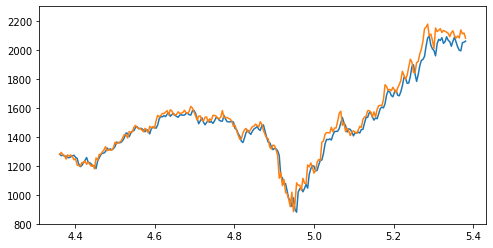

Test epoch:40 	Loss: 0.276130

Epoch: 41


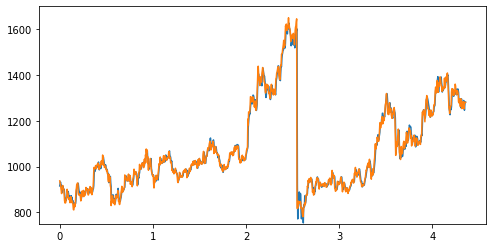

Train epoch:41 	Loss: -2.499451| Loss_in: 0.002300| Loss_out: 0.021727


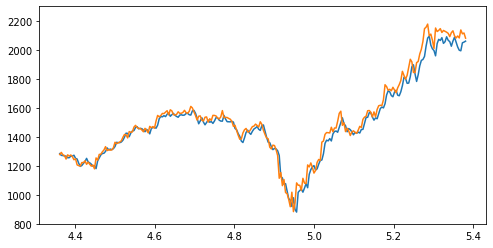

Test epoch:41 	Loss: 0.275626

Epoch: 42


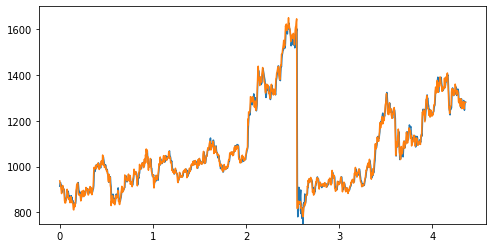

Train epoch:42 	Loss: -2.506173| Loss_in: 0.002308| Loss_out: 0.021632


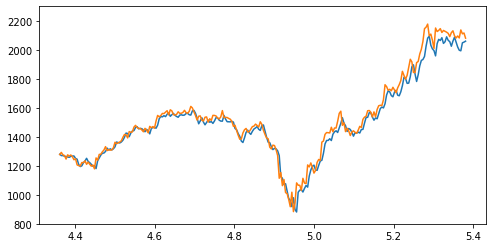

Test epoch:42 	Loss: 0.276545

Epoch: 43


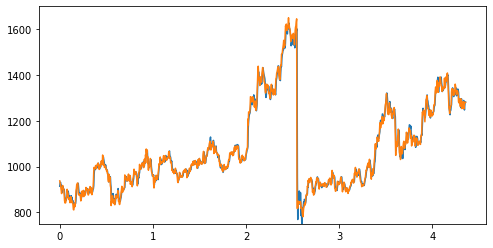

Train epoch:43 	Loss: -2.508019| Loss_in: 0.002269| Loss_out: 0.021415


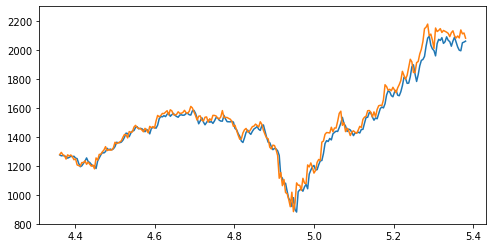

Test epoch:43 	Loss: 0.276088

Epoch: 44


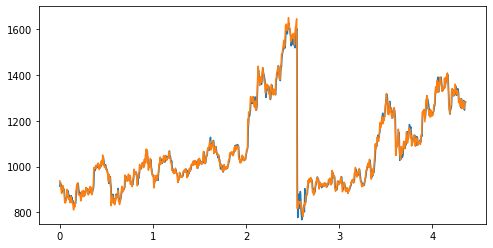

Train epoch:44 	Loss: -2.509191| Loss_in: 0.002231| Loss_out: 0.020961


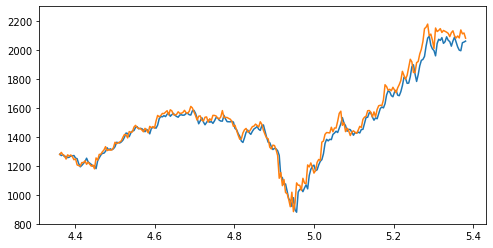

Test epoch:44 	Loss: 0.276322

Epoch: 45


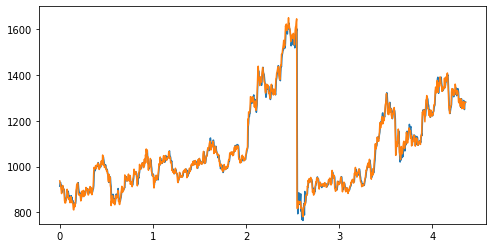

Train epoch:45 	Loss: -2.510899| Loss_in: 0.002209| Loss_out: 0.020919


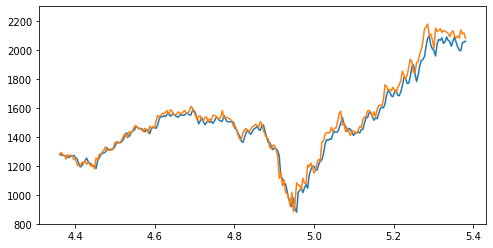

Test epoch:45 	Loss: 0.276542

Epoch: 46


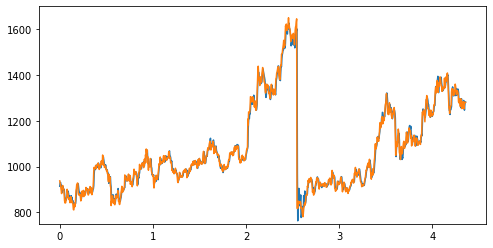

Train epoch:46 	Loss: -2.514330| Loss_in: 0.002187| Loss_out: 0.020806


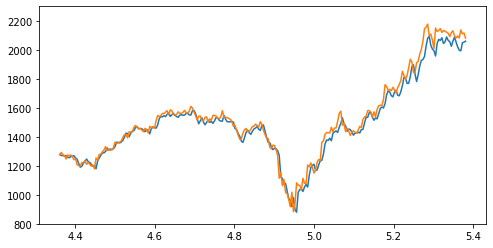

Test epoch:46 	Loss: 0.276399

Epoch: 47


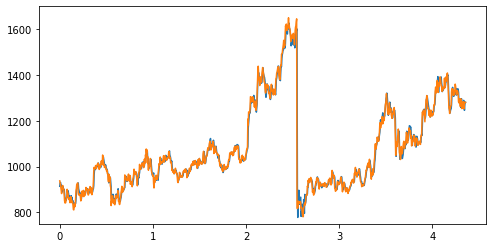

Train epoch:47 	Loss: -2.517337| Loss_in: 0.002203| Loss_out: 0.020835


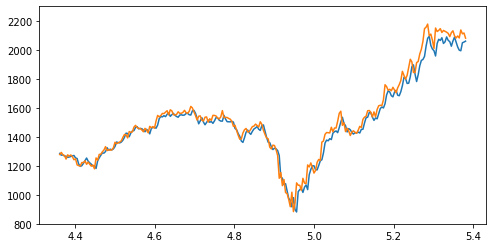

Test epoch:47 	Loss: 0.276338

Epoch: 48


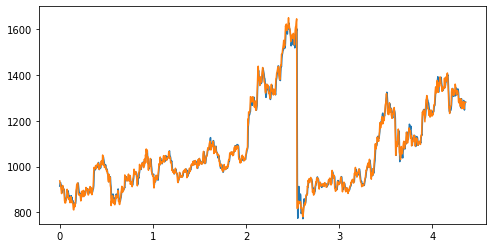

Train epoch:48 	Loss: -2.518821| Loss_in: 0.002160| Loss_out: 0.020194


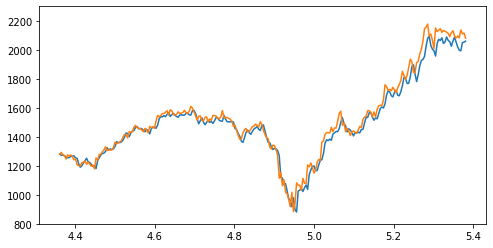

Test epoch:48 	Loss: 0.276978

Epoch: 49


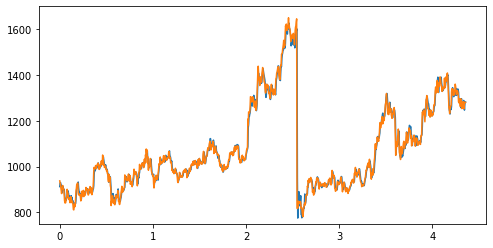

Train epoch:49 	Loss: -2.520210| Loss_in: 0.002116| Loss_out: 0.020040


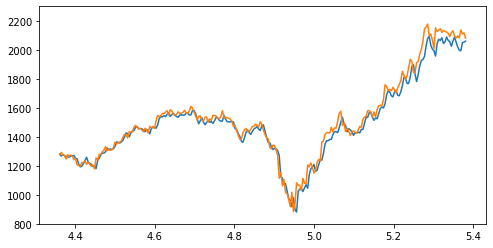

Test epoch:49 	Loss: 0.276686

Epoch: 50


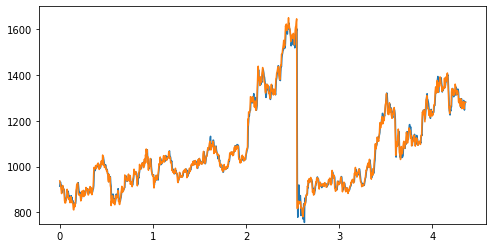

Train epoch:50 	Loss: -2.523049| Loss_in: 0.002119| Loss_out: 0.020113


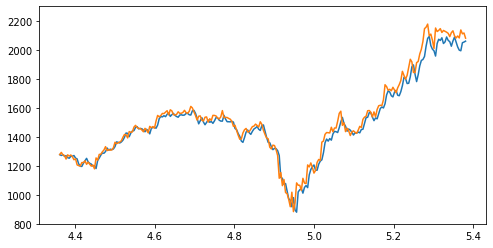

Test epoch:50 	Loss: 0.276235

Epoch: 51


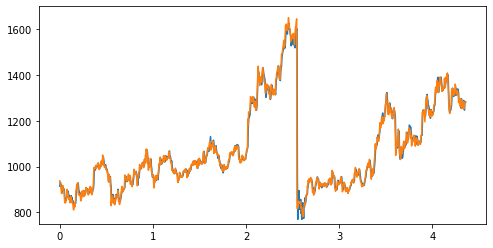

Train epoch:51 	Loss: -2.524504| Loss_in: 0.002090| Loss_out: 0.019911


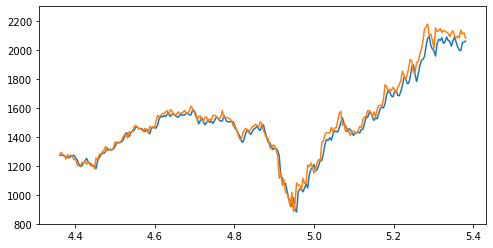

Test epoch:51 	Loss: 0.276273

Epoch: 52


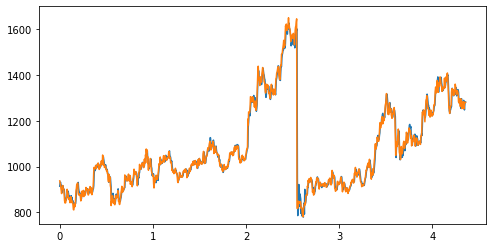

Train epoch:52 	Loss: -2.528056| Loss_in: 0.002064| Loss_out: 0.019493


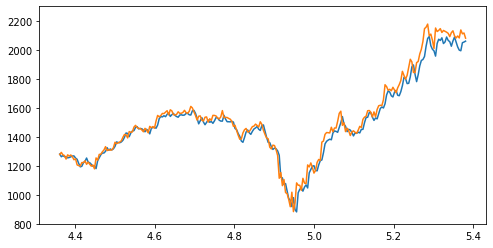

Test epoch:52 	Loss: 0.276187

Epoch: 53


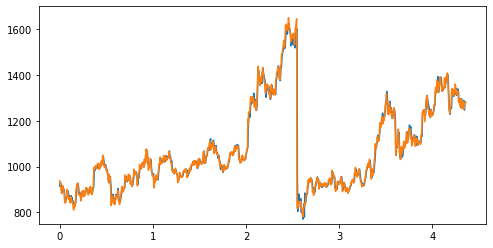

Train epoch:53 	Loss: -2.529240| Loss_in: 0.002057| Loss_out: 0.019450


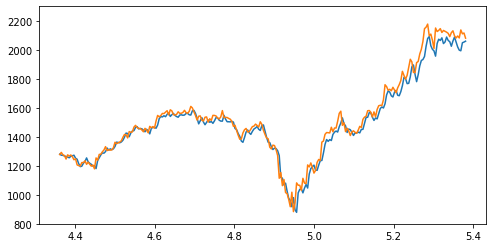

Test epoch:53 	Loss: 0.277626

Epoch: 54


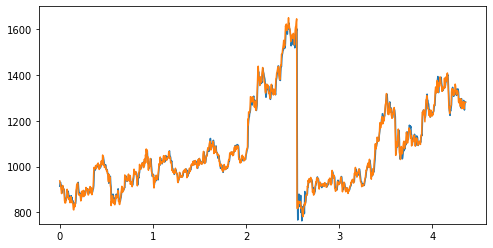

Train epoch:54 	Loss: -2.531798| Loss_in: 0.002050| Loss_out: 0.019233


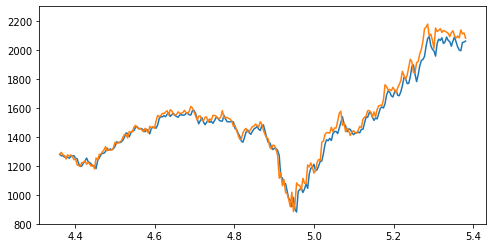

Test epoch:54 	Loss: 0.277742

Epoch: 55


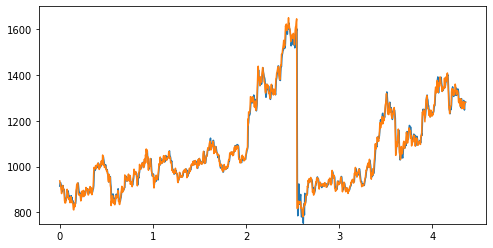

Train epoch:55 	Loss: -2.533065| Loss_in: 0.002046| Loss_out: 0.018957


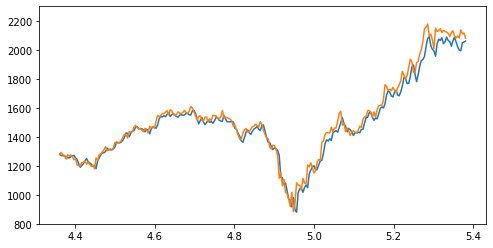

Test epoch:55 	Loss: 0.276737

Epoch: 56


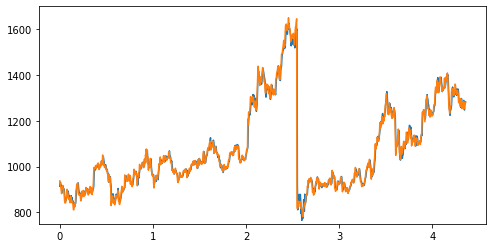

Train epoch:56 	Loss: -2.535897| Loss_in: 0.001999| Loss_out: 0.018699


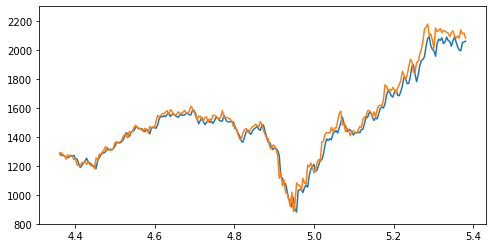

Test epoch:56 	Loss: 0.276487

Epoch: 57


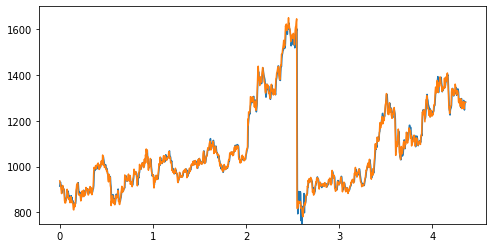

Train epoch:57 	Loss: -2.537326| Loss_in: 0.001993| Loss_out: 0.018381


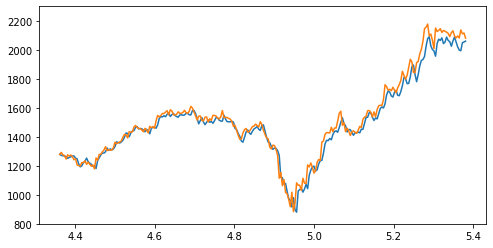

Test epoch:57 	Loss: 0.277262

Epoch: 58


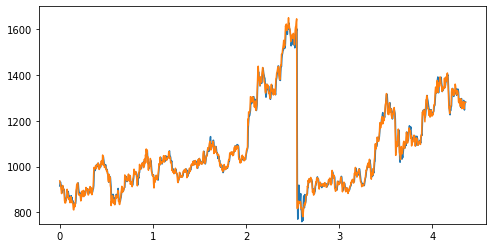

Train epoch:58 	Loss: -2.540299| Loss_in: 0.001970| Loss_out: 0.018244


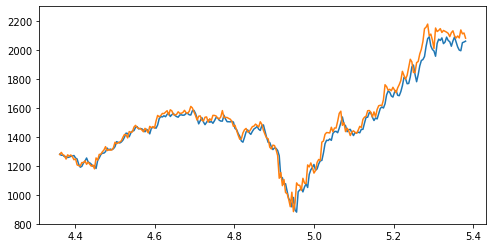

Test epoch:58 	Loss: 0.277235

Epoch: 59


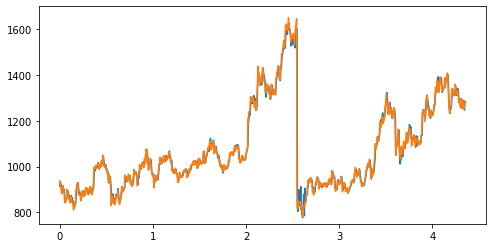

Train epoch:59 	Loss: -2.540589| Loss_in: 0.001958| Loss_out: 0.018128


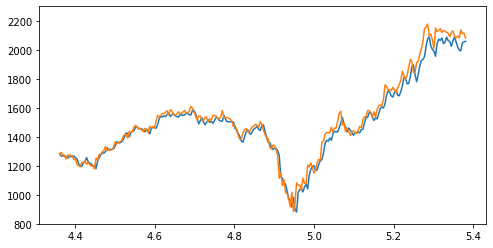

Test epoch:59 	Loss: 0.277792

Epoch: 60


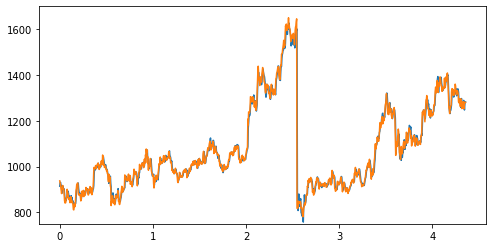

Train epoch:60 	Loss: -2.543627| Loss_in: 0.001968| Loss_out: 0.017942


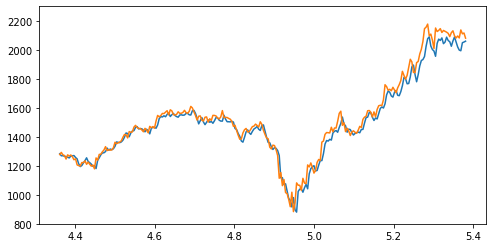

Test epoch:60 	Loss: 0.278195

Epoch: 61


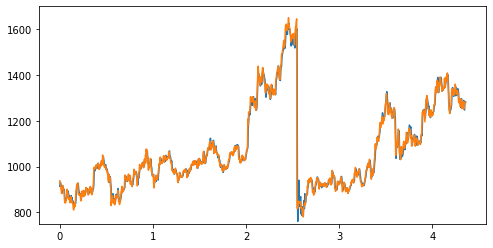

Train epoch:61 	Loss: -2.546174| Loss_in: 0.001924| Loss_out: 0.017560


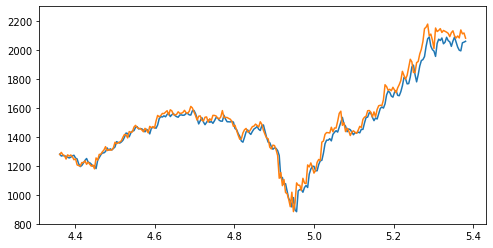

Test epoch:61 	Loss: 0.277589

Epoch: 62


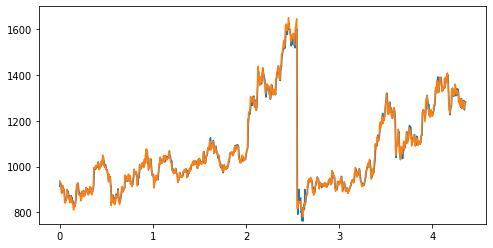

Train epoch:62 	Loss: -2.548741| Loss_in: 0.001915| Loss_out: 0.017384


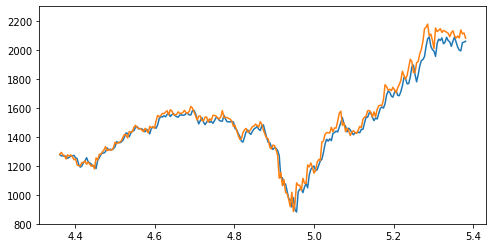

Test epoch:62 	Loss: 0.277684

Epoch: 63


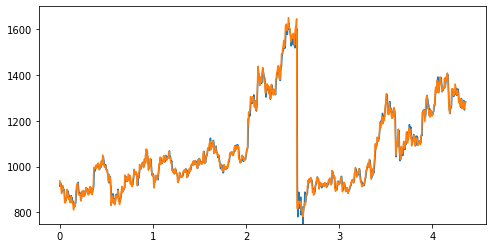

Train epoch:63 	Loss: -2.548327| Loss_in: 0.001922| Loss_out: 0.017158


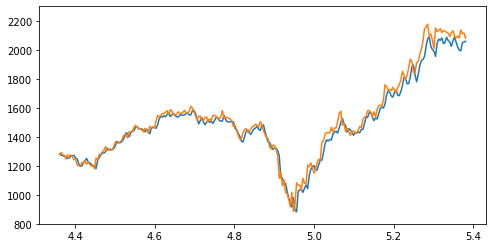

Test epoch:63 	Loss: 0.278254

Epoch: 64


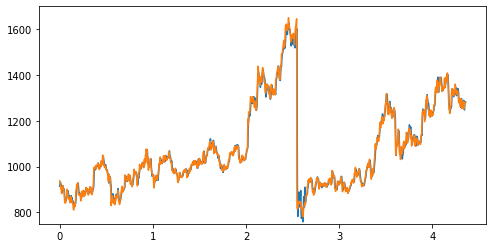

Train epoch:64 	Loss: -2.550593| Loss_in: 0.001904| Loss_out: 0.017047


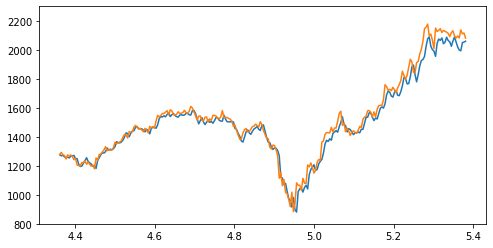

Test epoch:64 	Loss: 0.277735

Epoch: 65


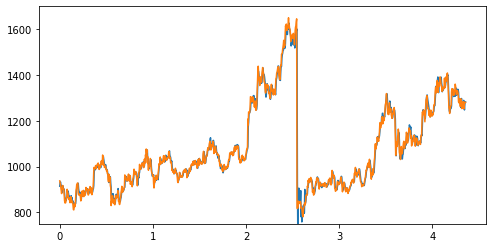

Train epoch:65 	Loss: -2.553067| Loss_in: 0.001867| Loss_out: 0.016769


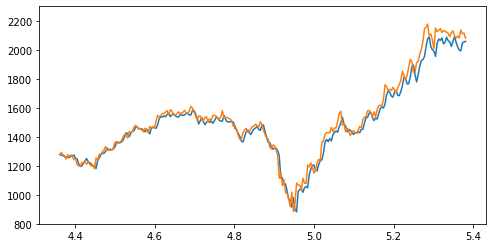

Test epoch:65 	Loss: 0.277855

Epoch: 66


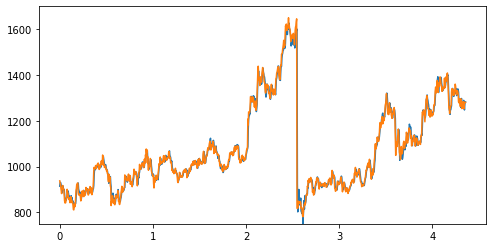

Train epoch:66 	Loss: -2.555957| Loss_in: 0.001861| Loss_out: 0.016765


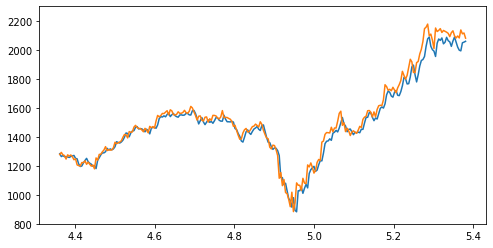

Test epoch:66 	Loss: 0.278850

Epoch: 67


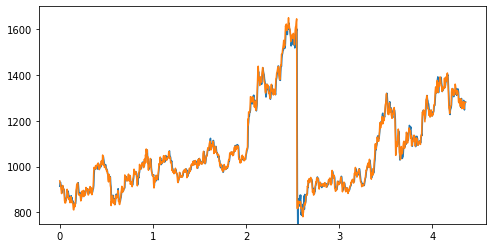

Train epoch:67 	Loss: -2.557137| Loss_in: 0.001804| Loss_out: 0.016492


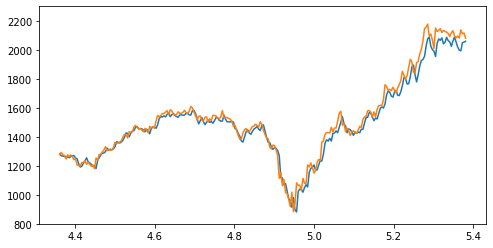

Test epoch:67 	Loss: 0.277819

Epoch: 68


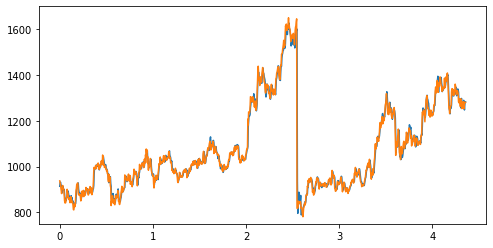

Train epoch:68 	Loss: -2.559845| Loss_in: 0.001801| Loss_out: 0.016427


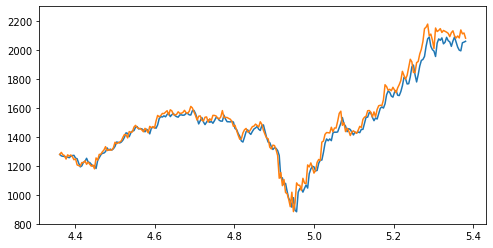

Test epoch:68 	Loss: 0.277175

Epoch: 69


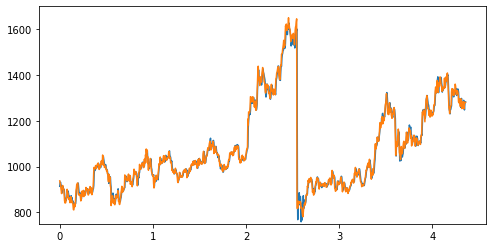

Train epoch:69 	Loss: -2.562114| Loss_in: 0.001754| Loss_out: 0.016211


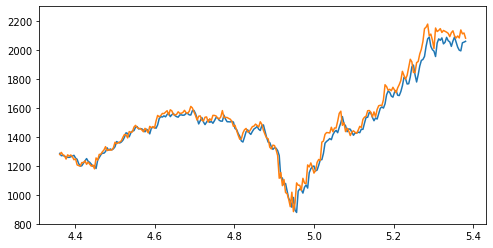

Test epoch:69 	Loss: 0.278128

Epoch: 70


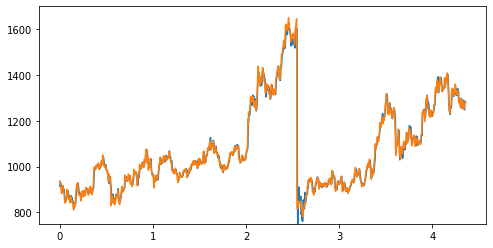

Train epoch:70 	Loss: -2.563988| Loss_in: 0.001768| Loss_out: 0.015960


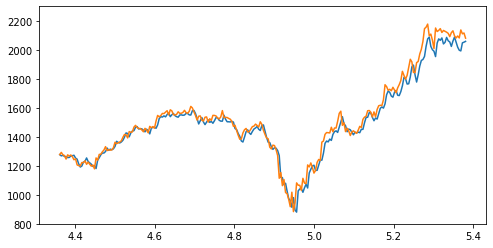

Test epoch:70 	Loss: 0.278533

Epoch: 71


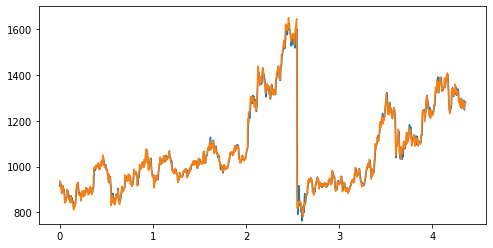

Train epoch:71 	Loss: -2.565733| Loss_in: 0.001737| Loss_out: 0.015963


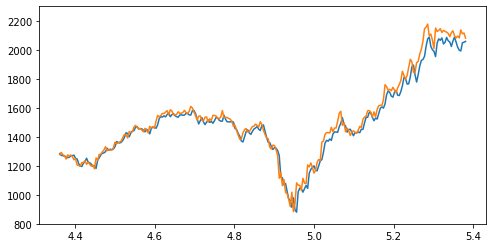

Test epoch:71 	Loss: 0.278408

Epoch: 72


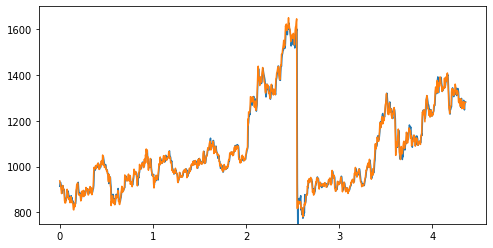

Train epoch:72 	Loss: -2.564395| Loss_in: 0.001764| Loss_out: 0.015672


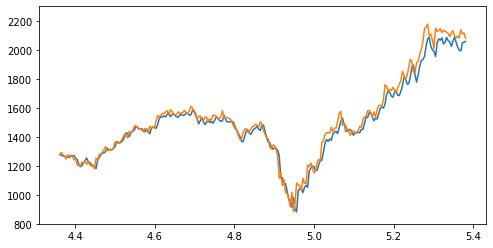

Test epoch:72 	Loss: 0.277229

Epoch: 73


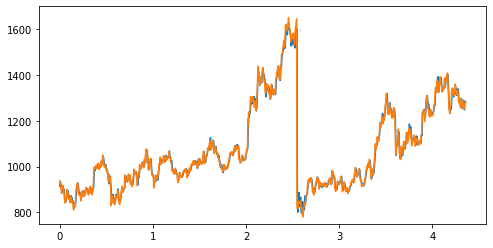

Train epoch:73 	Loss: -2.568497| Loss_in: 0.001676| Loss_out: 0.015644


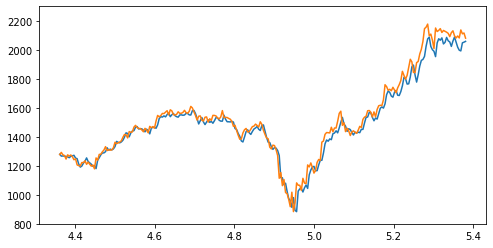

Test epoch:73 	Loss: 0.278577

Epoch: 74


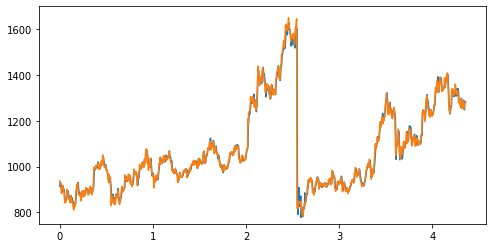

Train epoch:74 	Loss: -2.569711| Loss_in: 0.001699| Loss_out: 0.015602


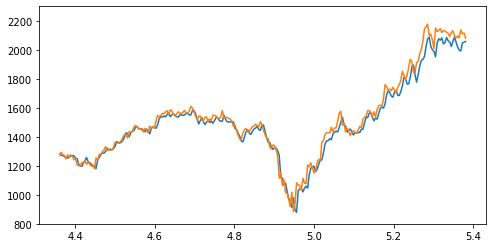

Test epoch:74 	Loss: 0.278707

Epoch: 75


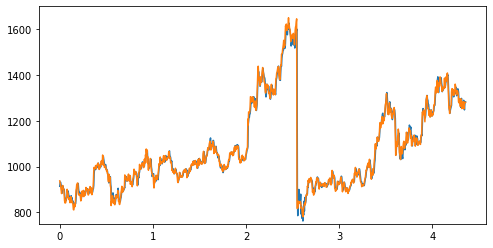

Train epoch:75 	Loss: -2.570247| Loss_in: 0.001666| Loss_out: 0.015196


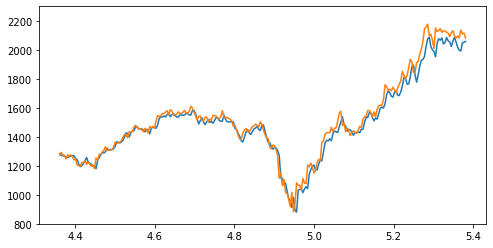

Test epoch:75 	Loss: 0.279234

Epoch: 76


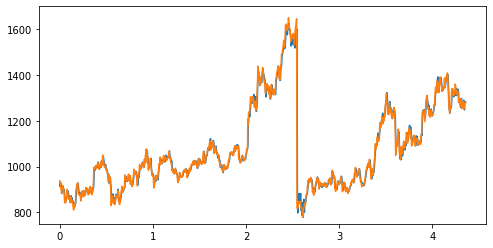

Train epoch:76 	Loss: -2.572114| Loss_in: 0.001663| Loss_out: 0.015339


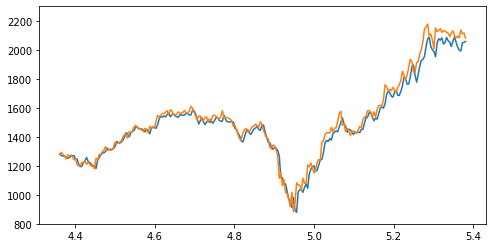

Test epoch:76 	Loss: 0.278225

Epoch: 77


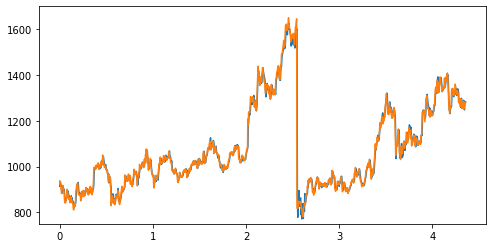

Train epoch:77 	Loss: -2.574466| Loss_in: 0.001673| Loss_out: 0.015238


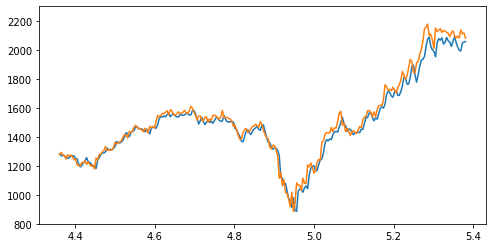

Test epoch:77 	Loss: 0.277932

Epoch: 78


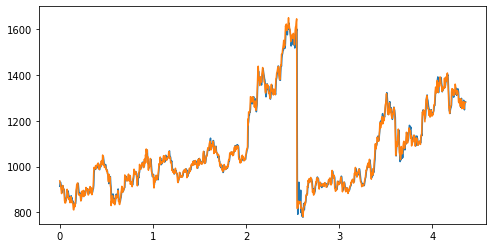

Train epoch:78 	Loss: -2.574686| Loss_in: 0.001630| Loss_out: 0.015056


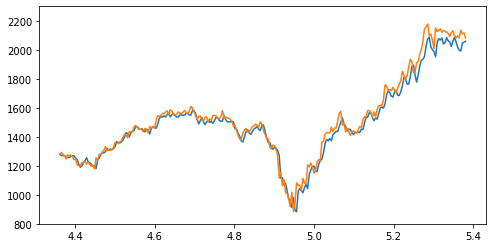

Test epoch:78 	Loss: 0.278405

Epoch: 79


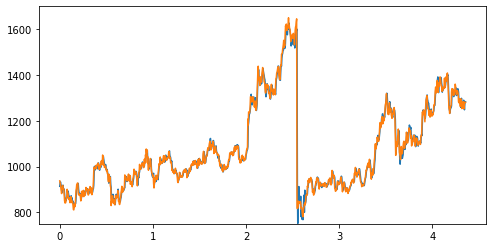

Train epoch:79 	Loss: -2.575818| Loss_in: 0.001631| Loss_out: 0.014907


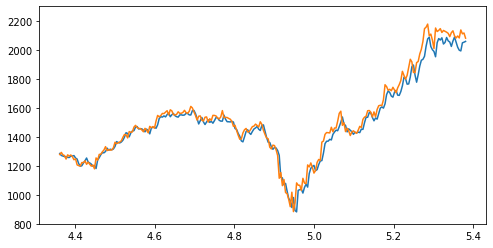

Test epoch:79 	Loss: 0.277273

Epoch: 80


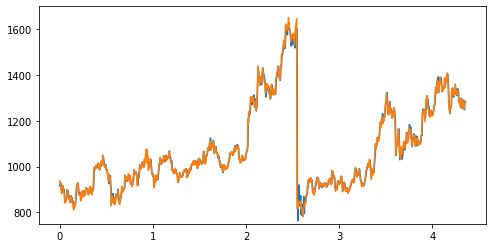

Train epoch:80 	Loss: -2.578548| Loss_in: 0.001632| Loss_out: 0.014747


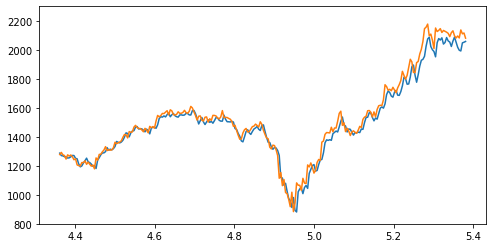

Test epoch:80 	Loss: 0.278506

Epoch: 81


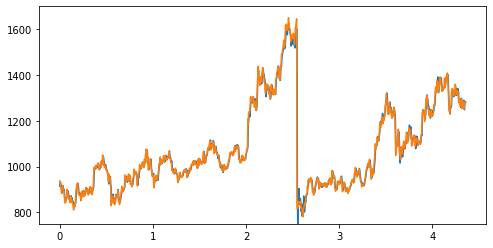

Train epoch:81 	Loss: -2.579743| Loss_in: 0.001603| Loss_out: 0.014848


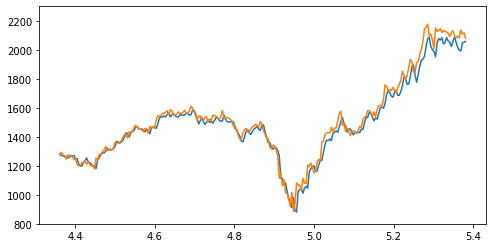

Test epoch:81 	Loss: 0.278784

Epoch: 82


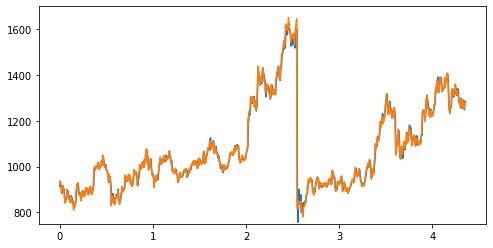

Train epoch:82 	Loss: -2.579317| Loss_in: 0.001609| Loss_out: 0.014397


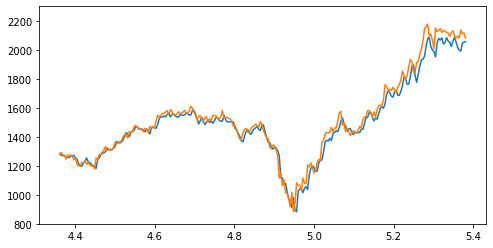

Test epoch:82 	Loss: 0.279189

Epoch: 83


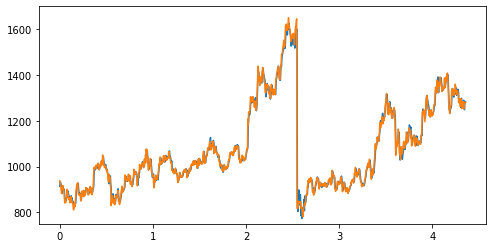

Train epoch:83 	Loss: -2.583248| Loss_in: 0.001578| Loss_out: 0.014559


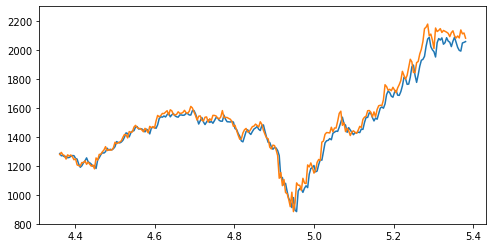

Test epoch:83 	Loss: 0.278495

Epoch: 84


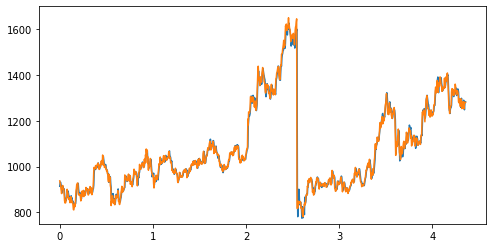

Train epoch:84 	Loss: -2.584002| Loss_in: 0.001590| Loss_out: 0.014326


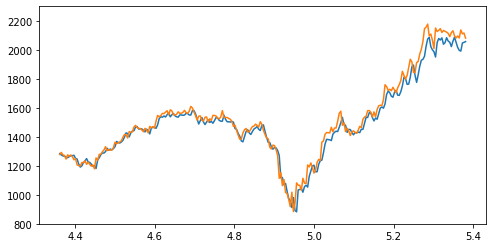

Test epoch:84 	Loss: 0.279662

Epoch: 85


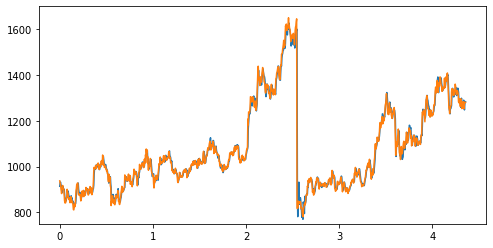

Train epoch:85 	Loss: -2.585423| Loss_in: 0.001550| Loss_out: 0.014115


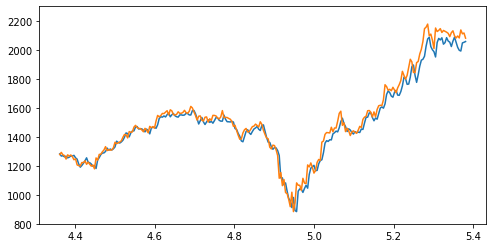

Test epoch:85 	Loss: 0.278276

Epoch: 86


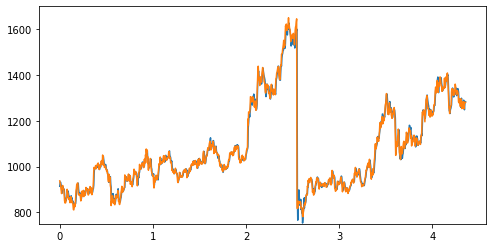

Train epoch:86 	Loss: -2.587137| Loss_in: 0.001548| Loss_out: 0.014244


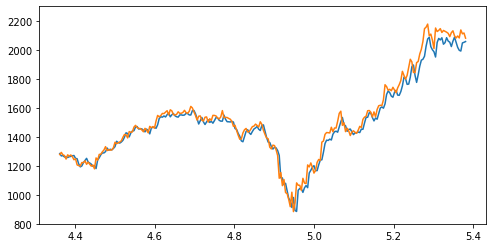

Test epoch:86 	Loss: 0.277818

Epoch: 87


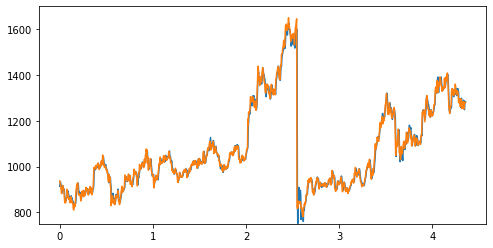

Train epoch:87 	Loss: -2.589173| Loss_in: 0.001539| Loss_out: 0.014046


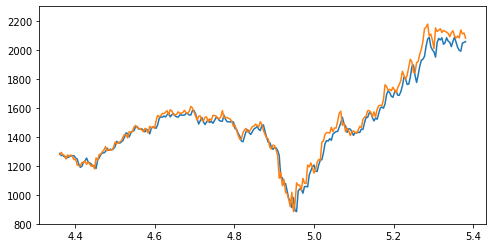

Test epoch:87 	Loss: 0.279844

Epoch: 88


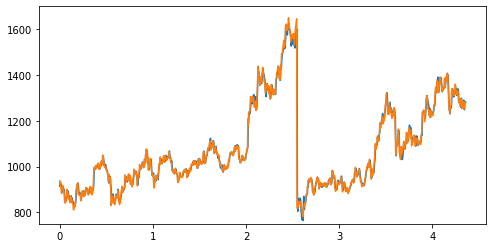

Train epoch:88 	Loss: -2.589804| Loss_in: 0.001518| Loss_out: 0.014057


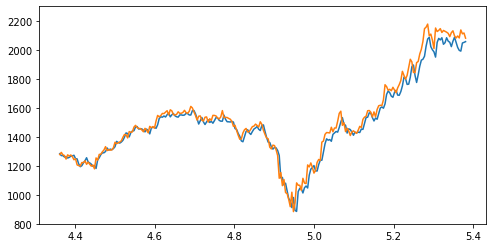

Test epoch:88 	Loss: 0.279830

Epoch: 89


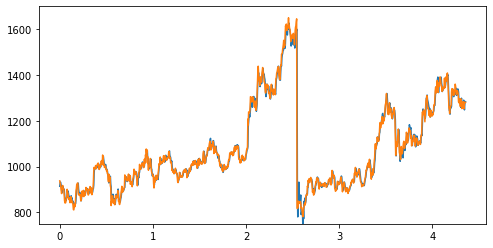

Train epoch:89 	Loss: -2.590973| Loss_in: 0.001549| Loss_out: 0.013975


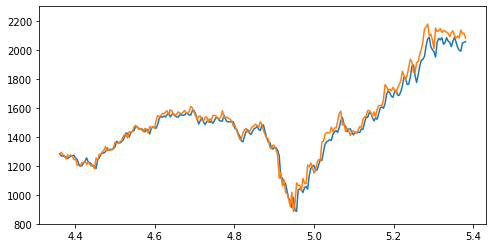

Test epoch:89 	Loss: 0.279714

Epoch: 90


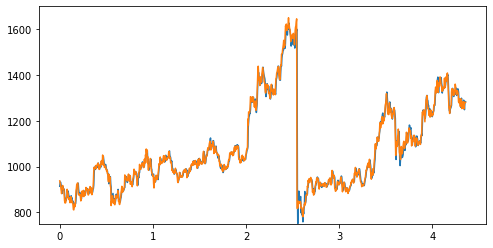

Train epoch:90 	Loss: -2.591961| Loss_in: 0.001510| Loss_out: 0.013828


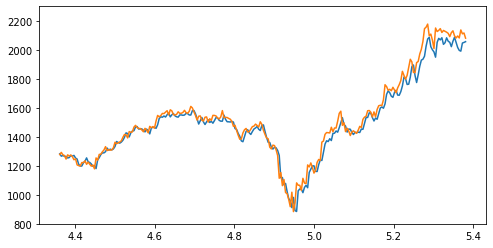

Test epoch:90 	Loss: 0.279815

Epoch: 91


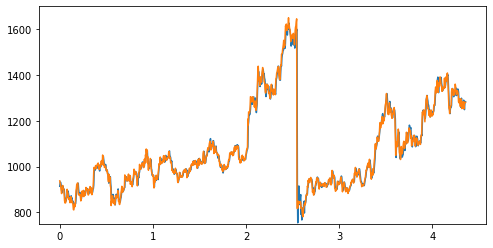

Train epoch:91 	Loss: -2.592339| Loss_in: 0.001497| Loss_out: 0.013747


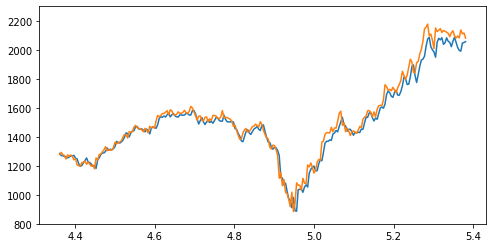

Test epoch:91 	Loss: 0.278411

Epoch: 92


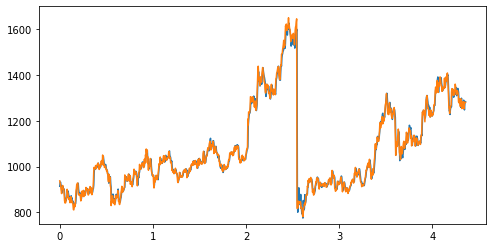

Train epoch:92 	Loss: -2.593554| Loss_in: 0.001514| Loss_out: 0.013700


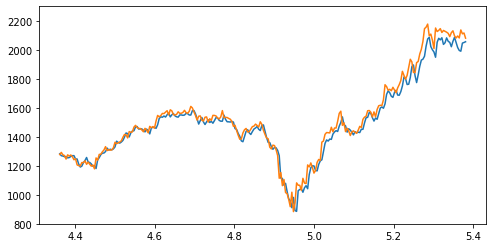

Test epoch:92 	Loss: 0.278993

Epoch: 93


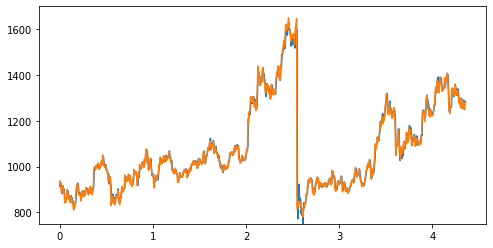

Train epoch:93 	Loss: -2.593982| Loss_in: 0.001519| Loss_out: 0.013714


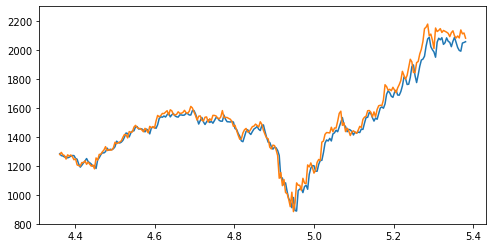

Test epoch:93 	Loss: 0.279311

Epoch: 94


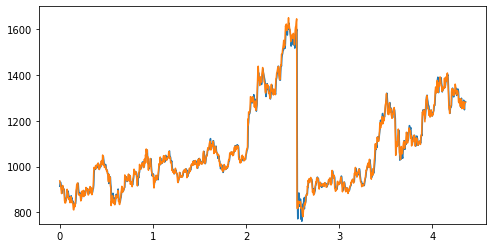

Train epoch:94 	Loss: -2.596920| Loss_in: 0.001510| Loss_out: 0.013504


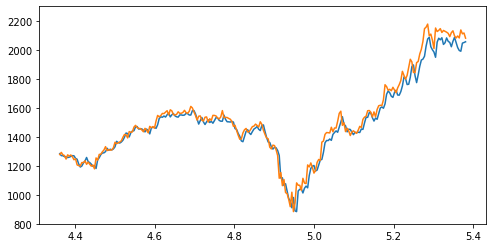

Test epoch:94 	Loss: 0.279777

Epoch: 95


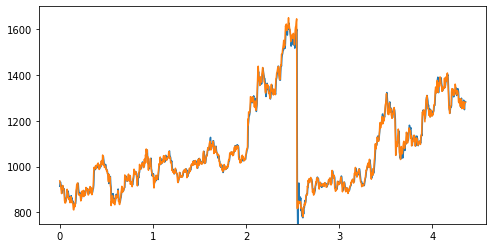

Train epoch:95 	Loss: -2.597919| Loss_in: 0.001493| Loss_out: 0.013557


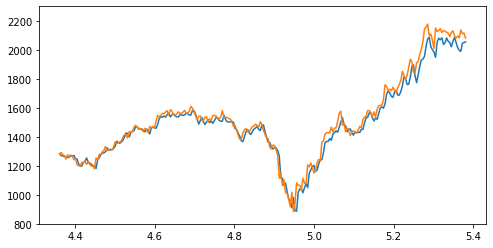

Test epoch:95 	Loss: 0.279621

Epoch: 96


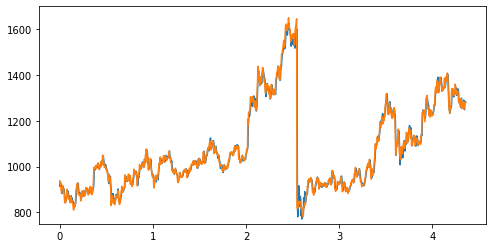

Train epoch:96 	Loss: -2.598167| Loss_in: 0.001490| Loss_out: 0.013389


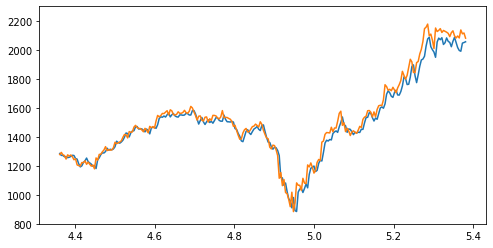

Test epoch:96 	Loss: 0.279439

Epoch: 97


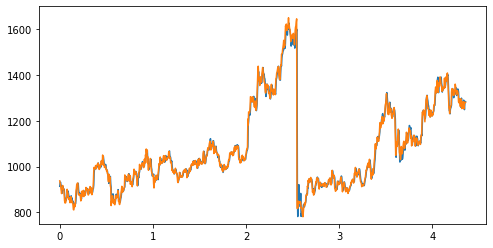

Train epoch:97 	Loss: -2.598692| Loss_in: 0.001516| Loss_out: 0.013364


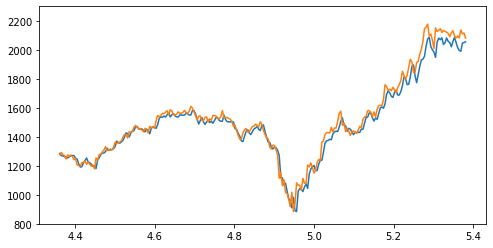

Test epoch:97 	Loss: 0.278950

Epoch: 98


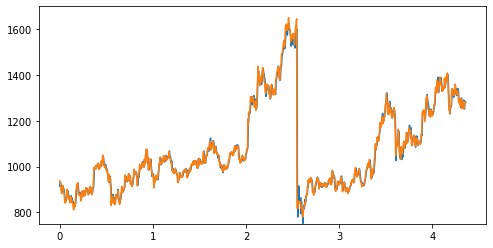

Train epoch:98 	Loss: -2.601337| Loss_in: 0.001483| Loss_out: 0.013319


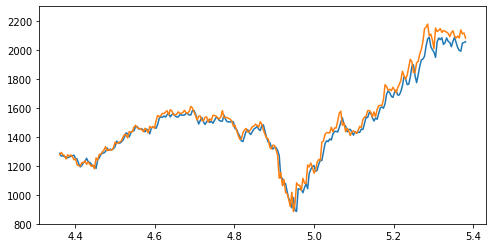

Test epoch:98 	Loss: 0.279185

Epoch: 99


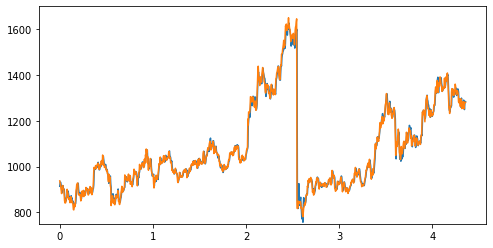

Train epoch:99 	Loss: -2.602692| Loss_in: 0.001469| Loss_out: 0.013095


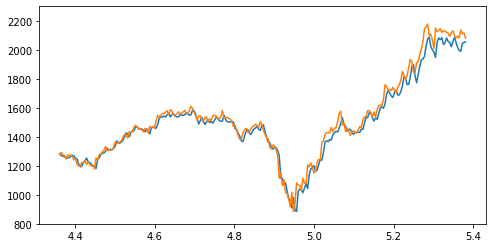

Test epoch:99 	Loss: 0.280269

Epoch: 100


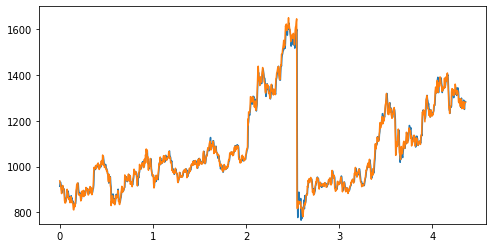

Train epoch:100 	Loss: -2.602225| Loss_in: 0.001482| Loss_out: 0.013026


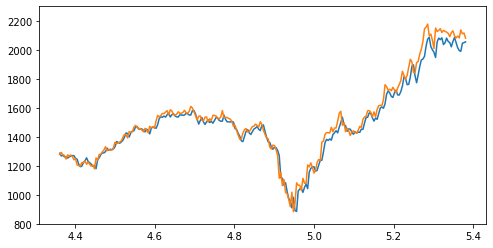

Test epoch:100 	Loss: 0.279614

Epoch: 101


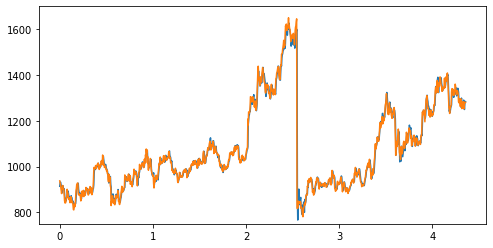

Train epoch:101 	Loss: -2.605195| Loss_in: 0.001443| Loss_out: 0.012981


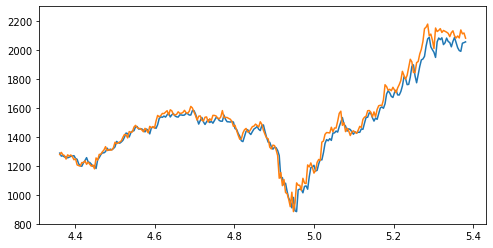

Test epoch:101 	Loss: 0.280293

Epoch: 102


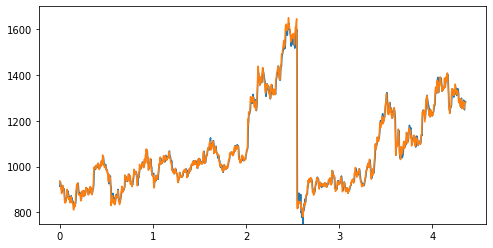

Train epoch:102 	Loss: -2.606162| Loss_in: 0.001463| Loss_out: 0.012929


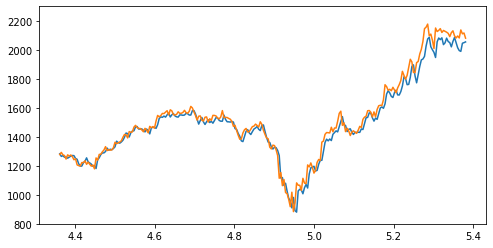

Test epoch:102 	Loss: 0.280343

Epoch: 103


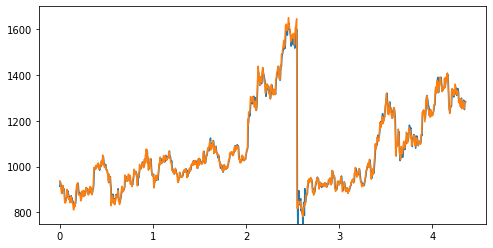

Train epoch:103 	Loss: -2.607629| Loss_in: 0.001457| Loss_out: 0.012830


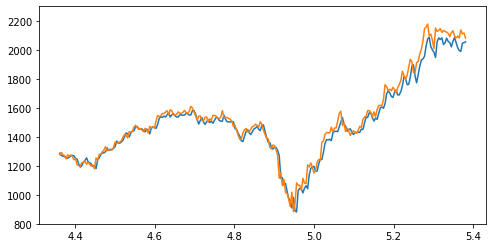

Test epoch:103 	Loss: 0.279698

Epoch: 104


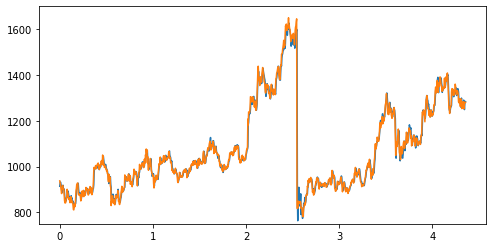

Train epoch:104 	Loss: -2.607212| Loss_in: 0.001416| Loss_out: 0.012671


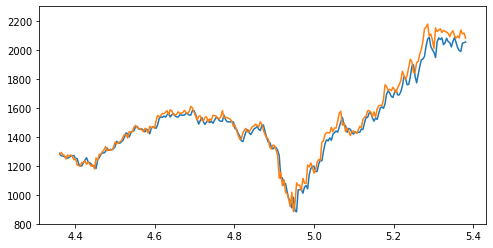

Test epoch:104 	Loss: 0.280799

Epoch: 105


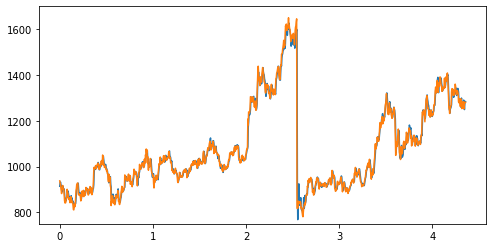

Train epoch:105 	Loss: -2.608543| Loss_in: 0.001443| Loss_out: 0.012592


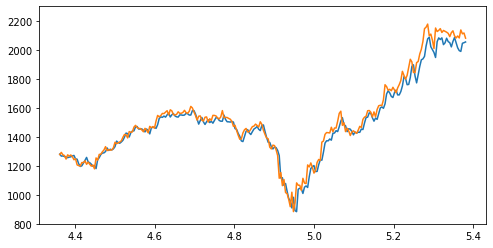

Test epoch:105 	Loss: 0.280343

Epoch: 106


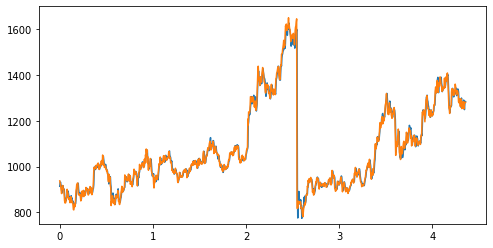

Train epoch:106 	Loss: -2.609535| Loss_in: 0.001439| Loss_out: 0.012713


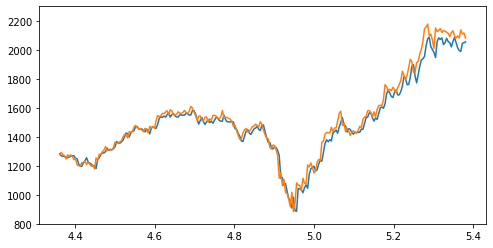

Test epoch:106 	Loss: 0.280454

Epoch: 107


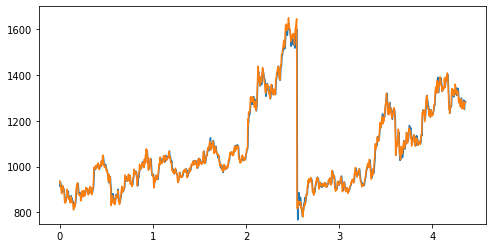

Train epoch:107 	Loss: -2.610571| Loss_in: 0.001420| Loss_out: 0.012606


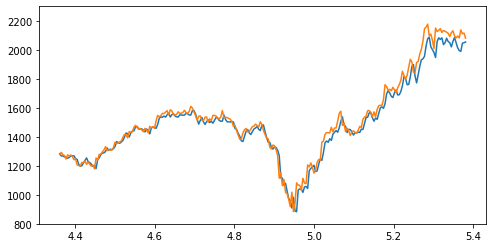

Test epoch:107 	Loss: 0.280075

Epoch: 108


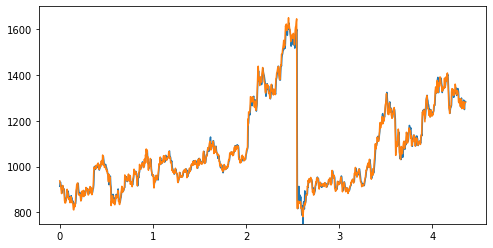

Train epoch:108 	Loss: -2.611154| Loss_in: 0.001447| Loss_out: 0.012481


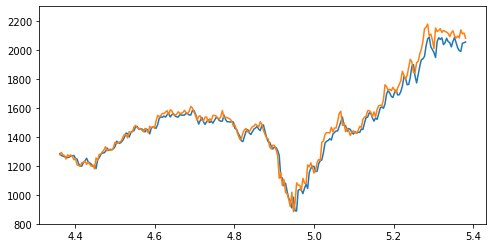

Test epoch:108 	Loss: 0.279178

Epoch: 109


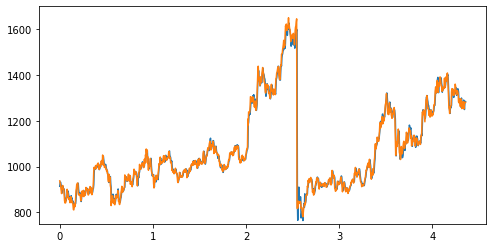

Train epoch:109 	Loss: -2.613067| Loss_in: 0.001442| Loss_out: 0.012380


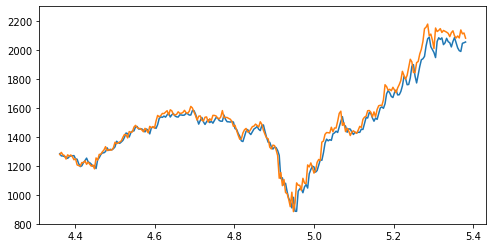

Test epoch:109 	Loss: 0.280543

Epoch: 110


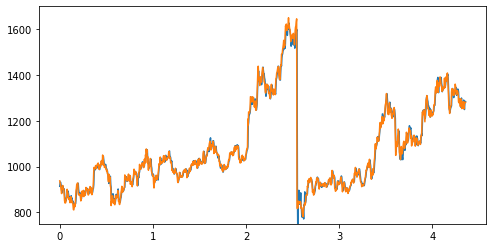

Train epoch:110 	Loss: -2.612405| Loss_in: 0.001417| Loss_out: 0.012376


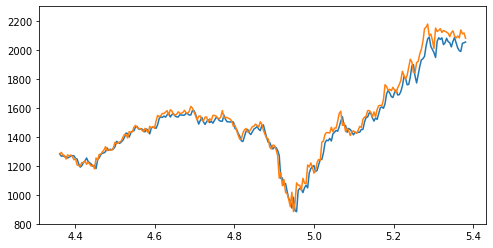

Test epoch:110 	Loss: 0.279022

Epoch: 111


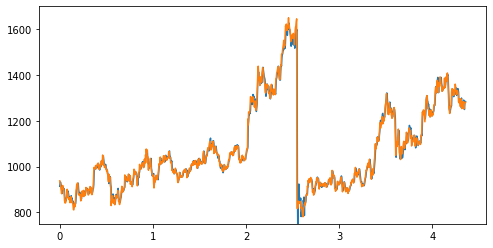

Train epoch:111 	Loss: -2.613922| Loss_in: 0.001408| Loss_out: 0.012270


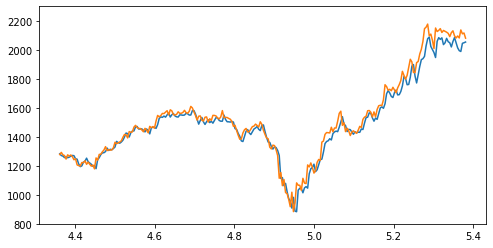

Test epoch:111 	Loss: 0.279844

Epoch: 112


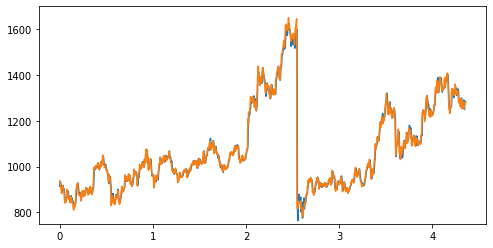

Train epoch:112 	Loss: -2.616633| Loss_in: 0.001389| Loss_out: 0.012149


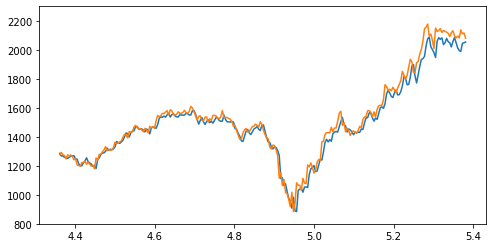

Test epoch:112 	Loss: 0.279696

Epoch: 113


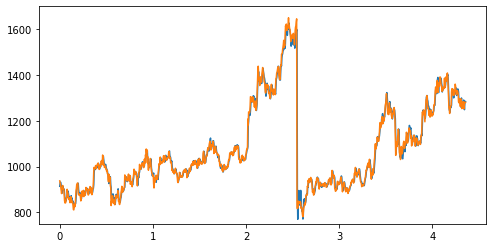

Train epoch:113 	Loss: -2.616986| Loss_in: 0.001402| Loss_out: 0.012122


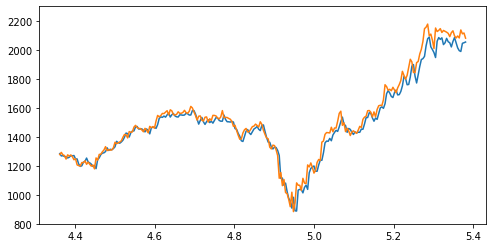

Test epoch:113 	Loss: 0.280168

Epoch: 114


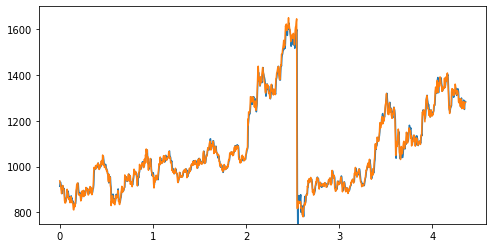

Train epoch:114 	Loss: -2.617730| Loss_in: 0.001412| Loss_out: 0.012129


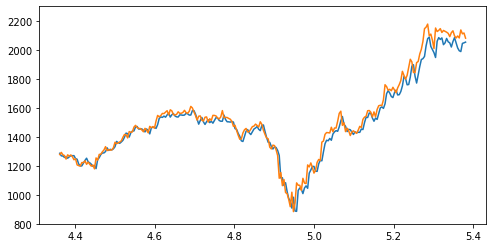

Test epoch:114 	Loss: 0.280233

Epoch: 115


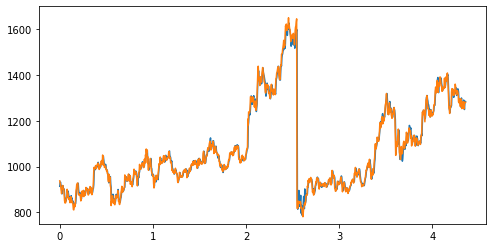

Train epoch:115 	Loss: -2.617895| Loss_in: 0.001405| Loss_out: 0.012072


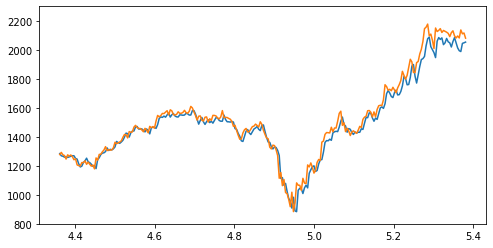

Test epoch:115 	Loss: 0.279888

Epoch: 116


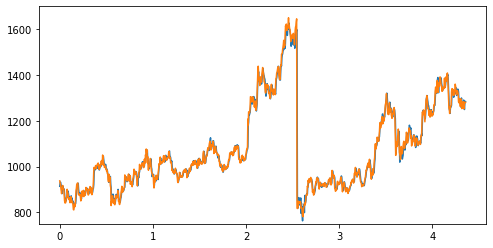

Train epoch:116 	Loss: -2.619040| Loss_in: 0.001419| Loss_out: 0.011985


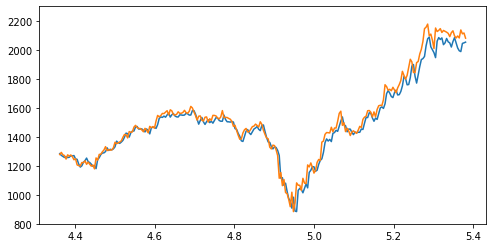

Test epoch:116 	Loss: 0.279704

Epoch: 117


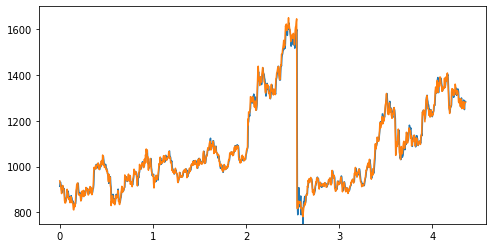

Train epoch:117 	Loss: -2.619651| Loss_in: 0.001444| Loss_out: 0.011911


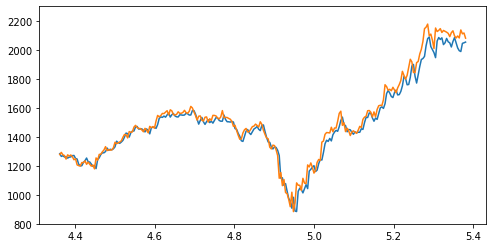

Test epoch:117 	Loss: 0.279619

Epoch: 118


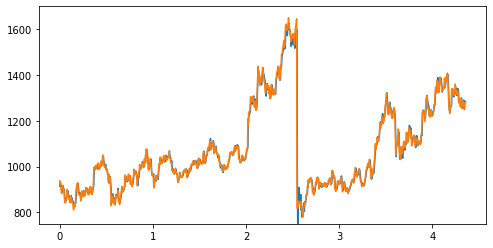

Train epoch:118 	Loss: -2.619326| Loss_in: 0.001372| Loss_out: 0.011807


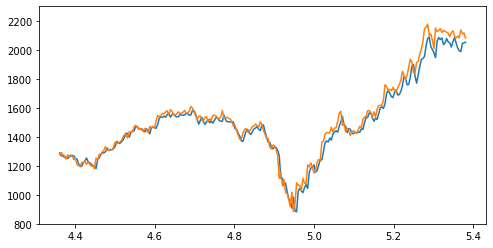

Test epoch:118 	Loss: 0.280402

Epoch: 119


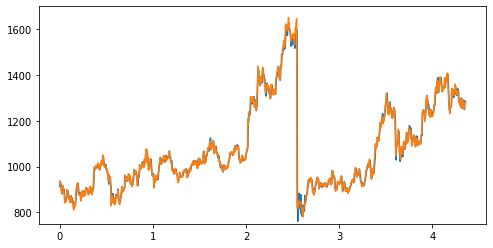

Train epoch:119 	Loss: -2.621111| Loss_in: 0.001389| Loss_out: 0.011643


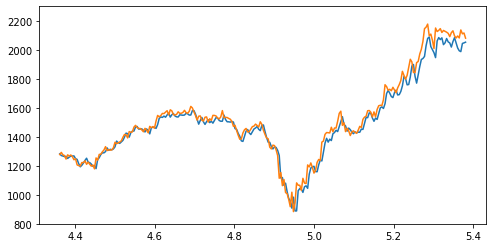

Test epoch:119 	Loss: 0.279921

Epoch: 120


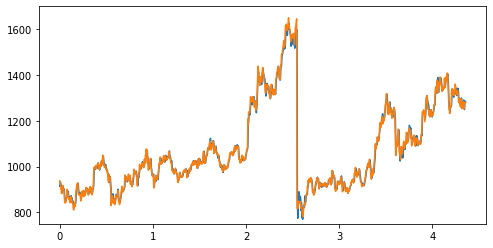

Train epoch:120 	Loss: -2.622564| Loss_in: 0.001359| Loss_out: 0.011572


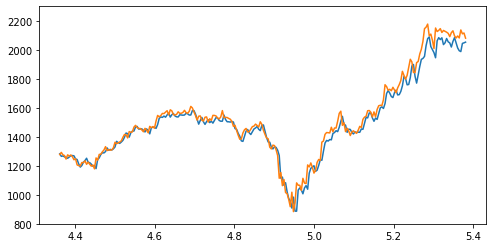

Test epoch:120 	Loss: 0.280587

Epoch: 121


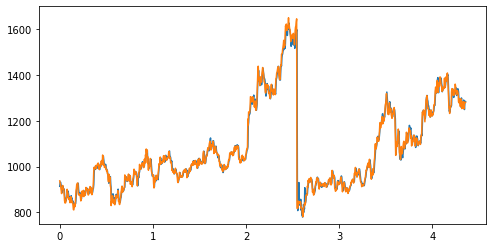

Train epoch:121 	Loss: -2.621600| Loss_in: 0.001379| Loss_out: 0.011525


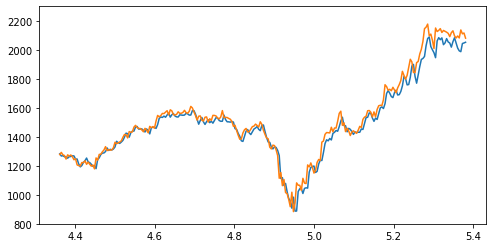

Test epoch:121 	Loss: 0.280466

Epoch: 122


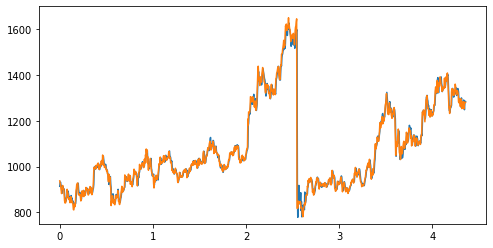

Train epoch:122 	Loss: -2.623667| Loss_in: 0.001365| Loss_out: 0.011478


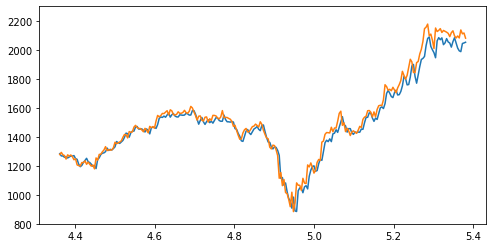

Test epoch:122 	Loss: 0.281811

Epoch: 123


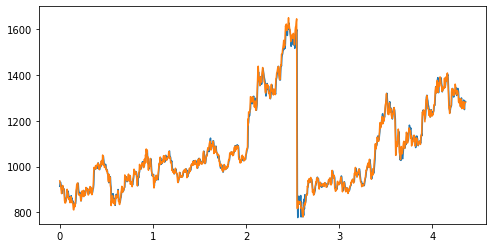

Train epoch:123 	Loss: -2.624411| Loss_in: 0.001393| Loss_out: 0.011363


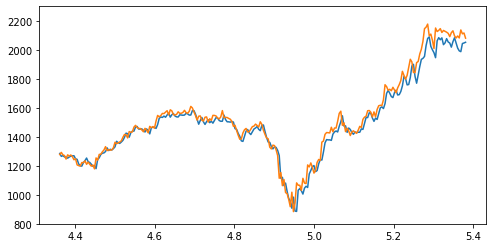

Test epoch:123 	Loss: 0.281030

Epoch: 124


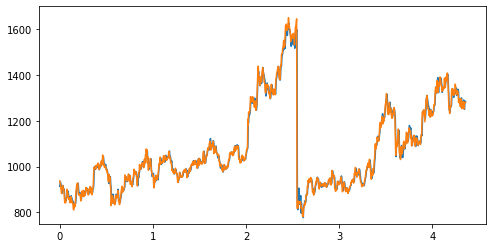

Train epoch:124 	Loss: -2.625412| Loss_in: 0.001367| Loss_out: 0.011317


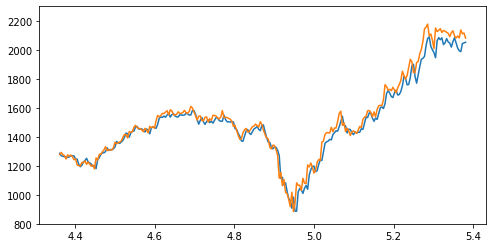

Test epoch:124 	Loss: 0.281568

Epoch: 125


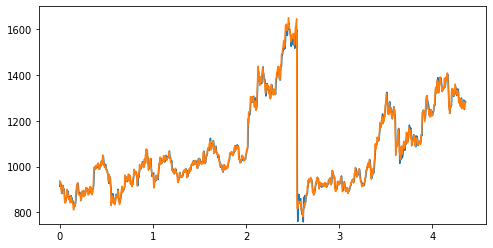

Train epoch:125 	Loss: -2.626694| Loss_in: 0.001373| Loss_out: 0.011329


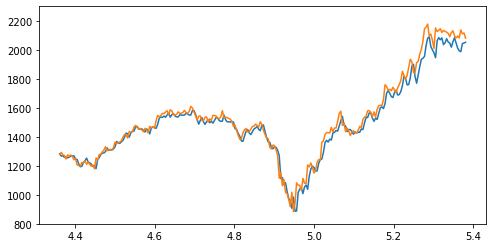

Test epoch:125 	Loss: 0.280723

Epoch: 126


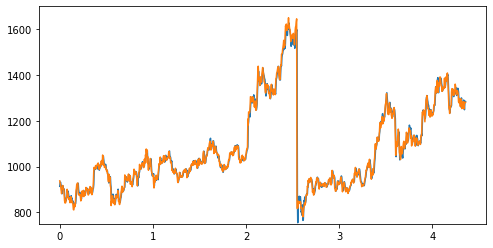

Train epoch:126 	Loss: -2.627247| Loss_in: 0.001343| Loss_out: 0.011227


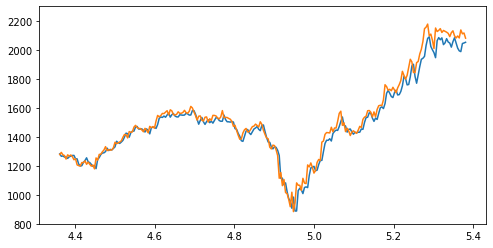

Test epoch:126 	Loss: 0.279265

Epoch: 127


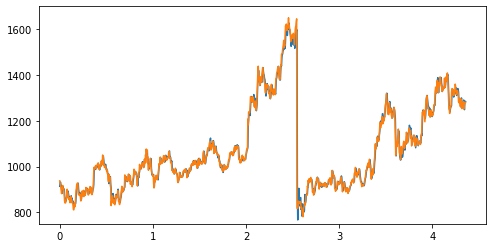

Train epoch:127 	Loss: -2.628592| Loss_in: 0.001370| Loss_out: 0.011166


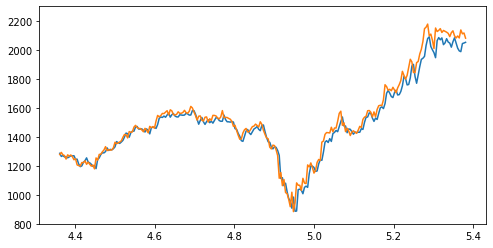

Test epoch:127 	Loss: 0.280181

Epoch: 128


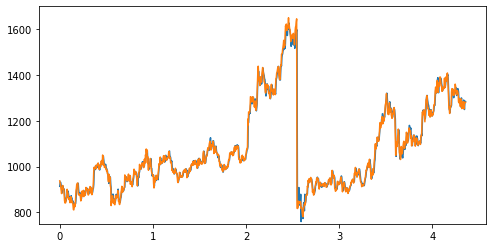

Train epoch:128 	Loss: -2.625850| Loss_in: 0.001373| Loss_out: 0.010981


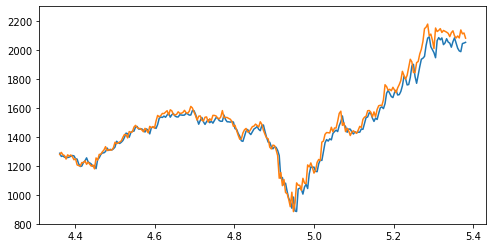

Test epoch:128 	Loss: 0.280172

Epoch: 129


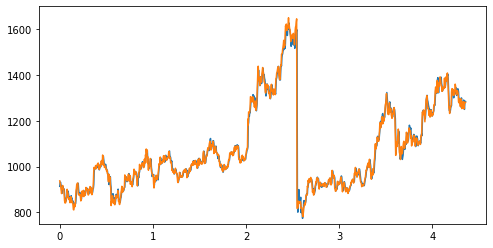

Train epoch:129 	Loss: -2.628049| Loss_in: 0.001356| Loss_out: 0.011050


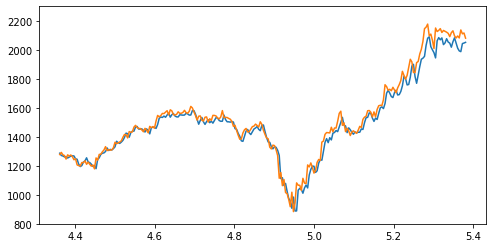

Test epoch:129 	Loss: 0.280019

Epoch: 130


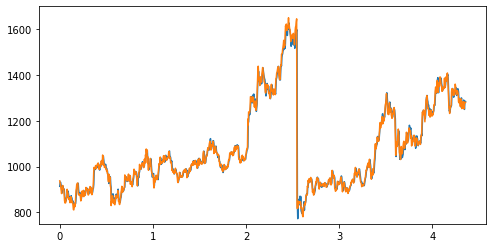

Train epoch:130 	Loss: -2.630562| Loss_in: 0.001354| Loss_out: 0.011126


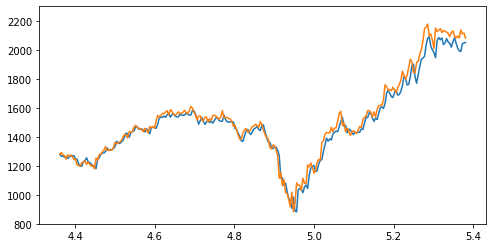

Test epoch:130 	Loss: 0.279738

Epoch: 131


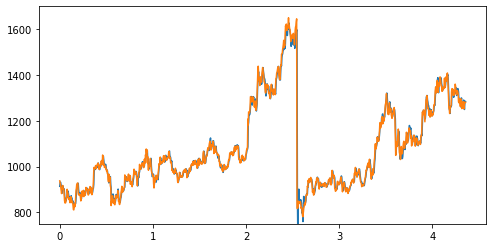

Train epoch:131 	Loss: -2.630085| Loss_in: 0.001344| Loss_out: 0.011081


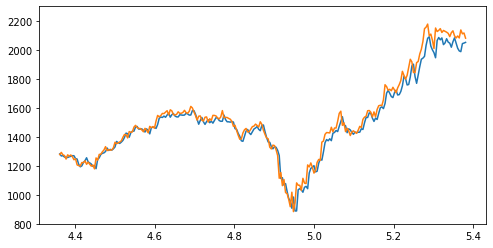

Test epoch:131 	Loss: 0.279388

Epoch: 132


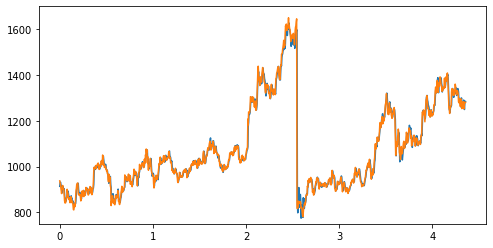

Train epoch:132 	Loss: -2.630195| Loss_in: 0.001348| Loss_out: 0.010811


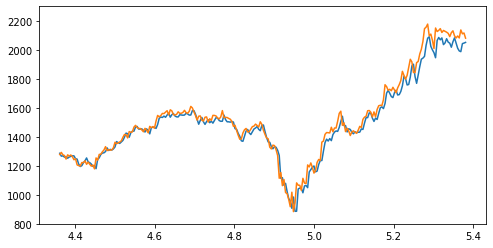

Test epoch:132 	Loss: 0.279648

Epoch: 133


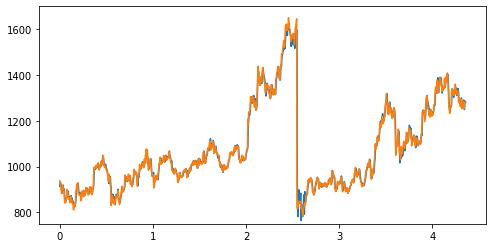

Train epoch:133 	Loss: -2.631004| Loss_in: 0.001359| Loss_out: 0.010782


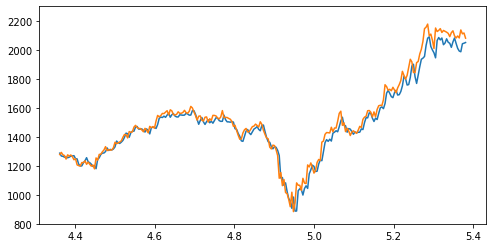

Test epoch:133 	Loss: 0.282445

Epoch: 134


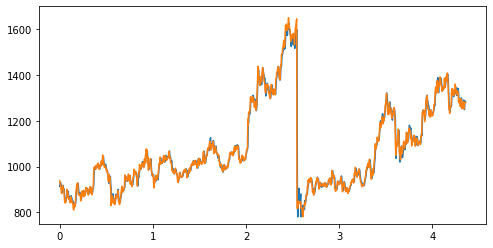

Train epoch:134 	Loss: -2.632575| Loss_in: 0.001363| Loss_out: 0.010617


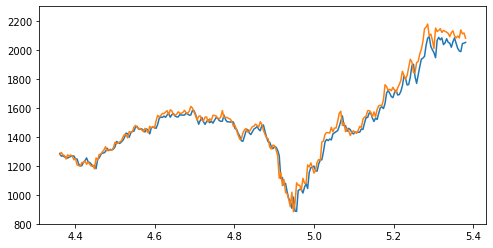

Test epoch:134 	Loss: 0.279295

Epoch: 135


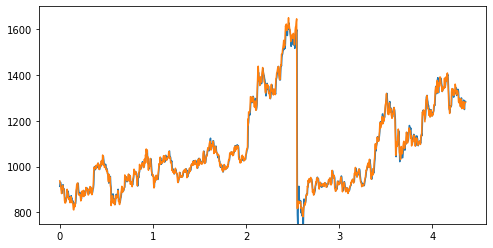

Train epoch:135 	Loss: -2.632220| Loss_in: 0.001316| Loss_out: 0.010573


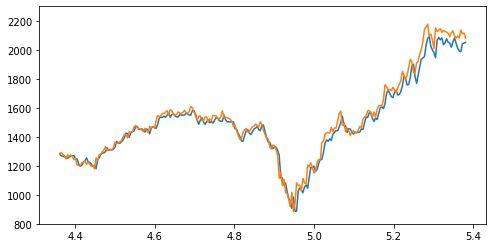

Test epoch:135 	Loss: 0.280351

Epoch: 136


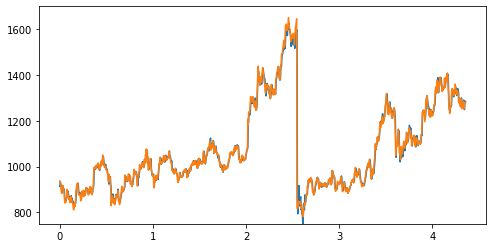

Train epoch:136 	Loss: -2.633066| Loss_in: 0.001357| Loss_out: 0.010660


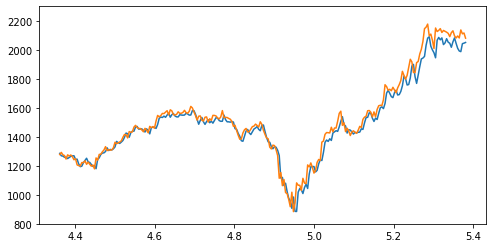

Test epoch:136 	Loss: 0.280723

Epoch: 137


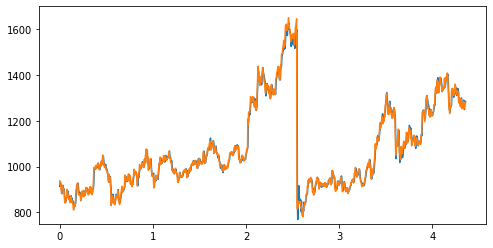

Train epoch:137 	Loss: -2.633580| Loss_in: 0.001325| Loss_out: 0.010415


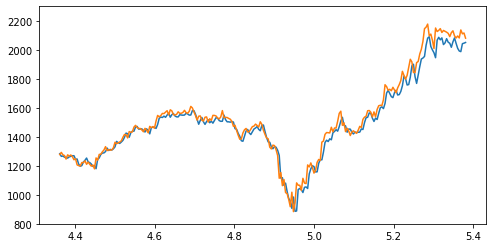

Test epoch:137 	Loss: 0.279516

Epoch: 138


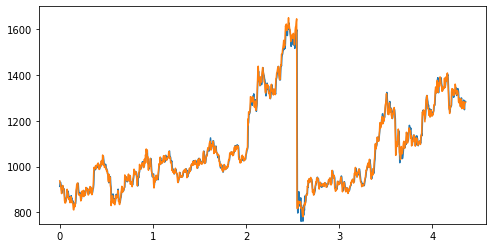

Train epoch:138 	Loss: -2.634899| Loss_in: 0.001290| Loss_out: 0.010601


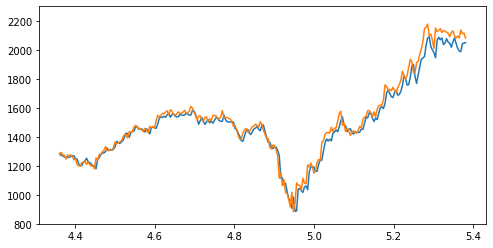

Test epoch:138 	Loss: 0.279751

Epoch: 139


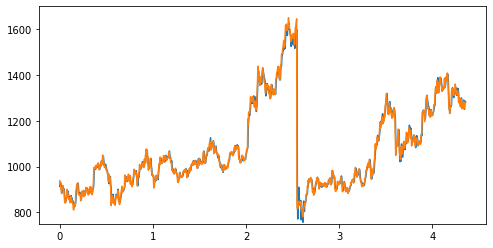

Train epoch:139 	Loss: -2.635356| Loss_in: 0.001308| Loss_out: 0.010373


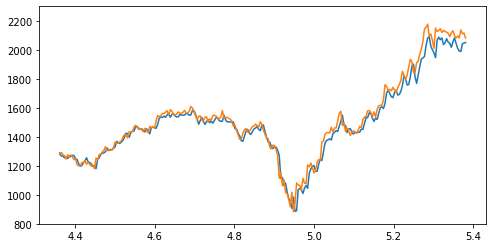

Test epoch:139 	Loss: 0.280442

Epoch: 140


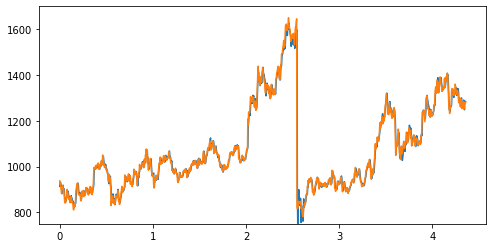

Train epoch:140 	Loss: -2.634918| Loss_in: 0.001328| Loss_out: 0.010453


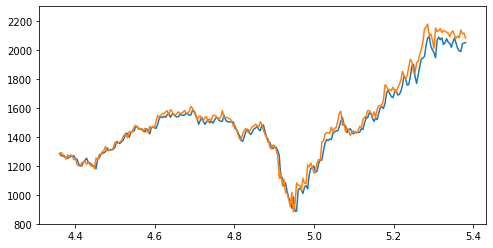

Test epoch:140 	Loss: 0.279926

Epoch: 141


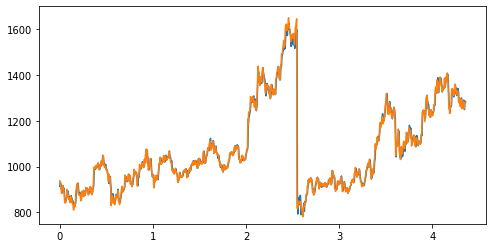

Train epoch:141 	Loss: -2.636394| Loss_in: 0.001307| Loss_out: 0.010395


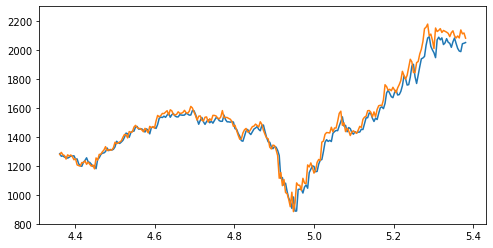

Test epoch:141 	Loss: 0.280109

Epoch: 142


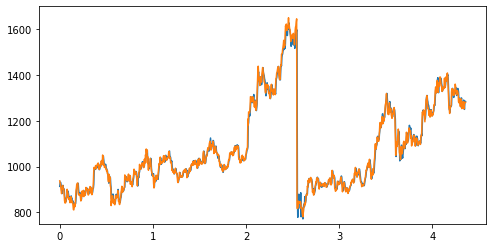

Train epoch:142 	Loss: -2.636936| Loss_in: 0.001320| Loss_out: 0.010317


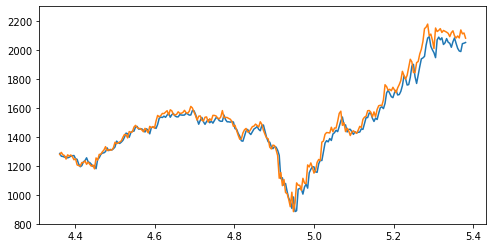

Test epoch:142 	Loss: 0.280186

Epoch: 143


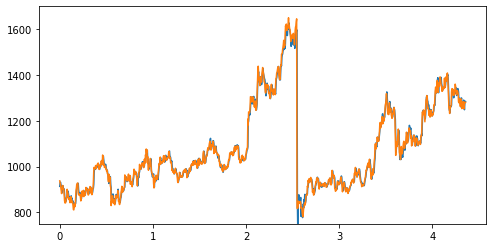

Train epoch:143 	Loss: -2.637556| Loss_in: 0.001316| Loss_out: 0.010220


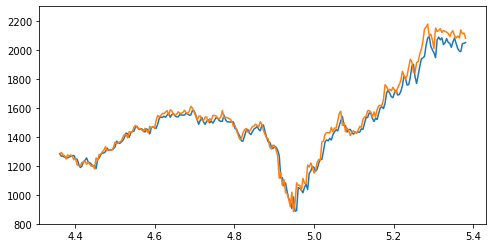

Test epoch:143 	Loss: 0.278689

Epoch: 144


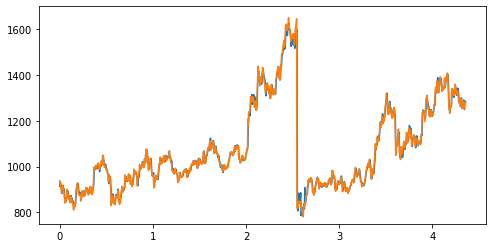

Train epoch:144 	Loss: -2.638816| Loss_in: 0.001280| Loss_out: 0.010104


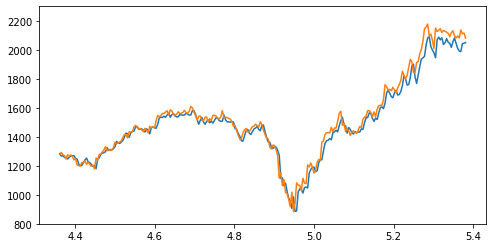

Test epoch:144 	Loss: 0.279144

Epoch: 145


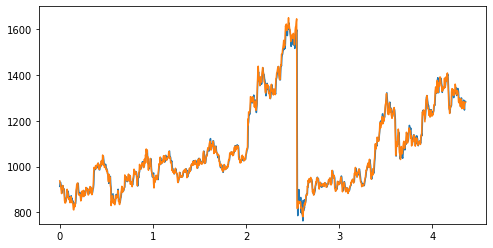

Train epoch:145 	Loss: -2.638235| Loss_in: 0.001297| Loss_out: 0.010092


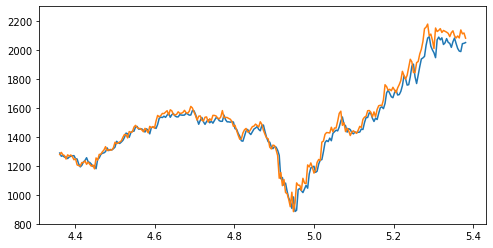

Test epoch:145 	Loss: 0.279346

Epoch: 146


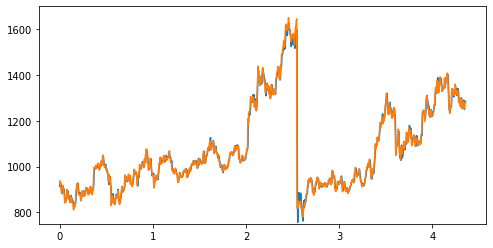

Train epoch:146 	Loss: -2.636655| Loss_in: 0.001281| Loss_out: 0.009934


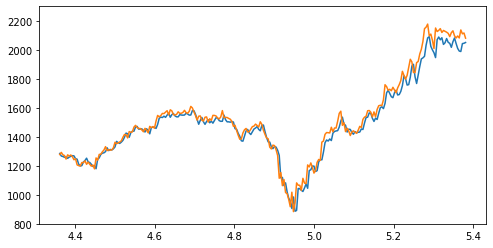

Test epoch:146 	Loss: 0.278138

Epoch: 147


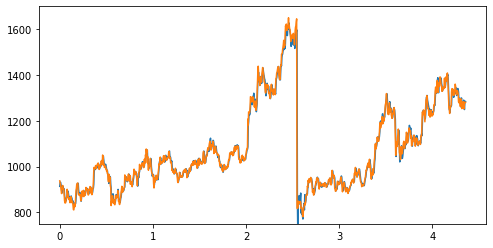

Train epoch:147 	Loss: -2.639039| Loss_in: 0.001265| Loss_out: 0.010012


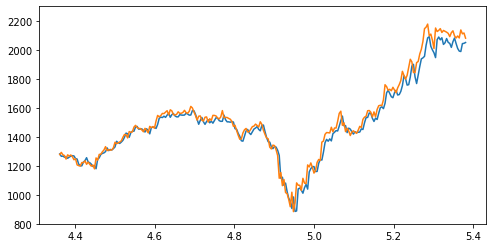

Test epoch:147 	Loss: 0.279773

Epoch: 148


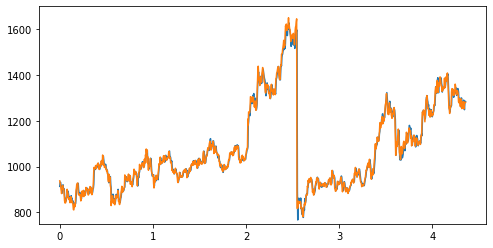

Train epoch:148 	Loss: -2.640088| Loss_in: 0.001274| Loss_out: 0.009947


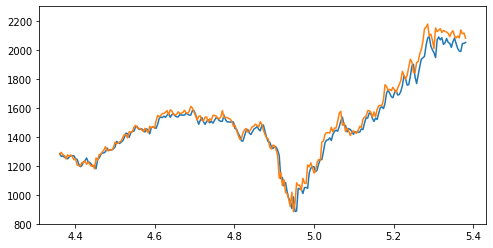

Test epoch:148 	Loss: 0.278893

Epoch: 149


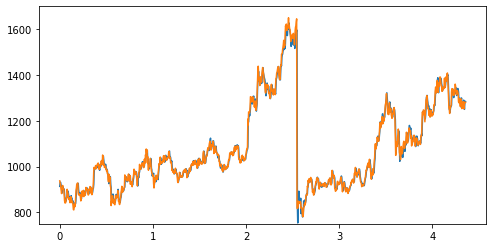

Train epoch:149 	Loss: -2.639119| Loss_in: 0.001272| Loss_out: 0.009968


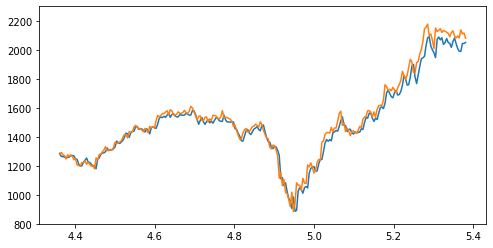

Test epoch:149 	Loss: 0.278838

Epoch: 150


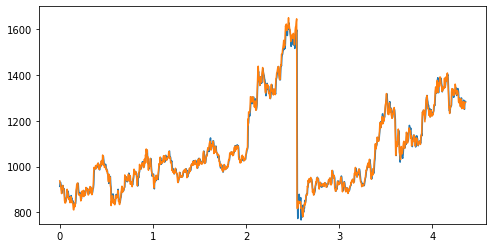

Train epoch:150 	Loss: -2.641664| Loss_in: 0.001261| Loss_out: 0.009755


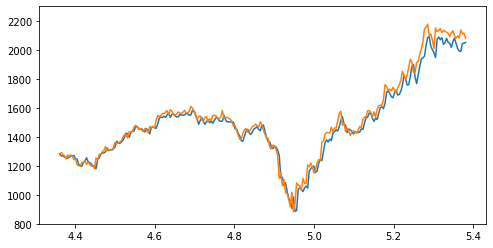

Test epoch:150 	Loss: 0.278145

Epoch: 151


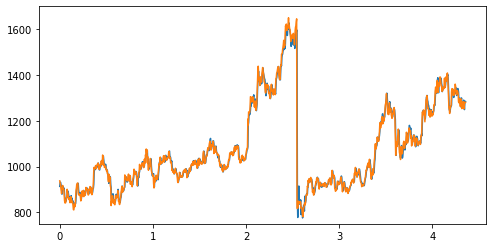

Train epoch:151 	Loss: -2.641500| Loss_in: 0.001254| Loss_out: 0.009822


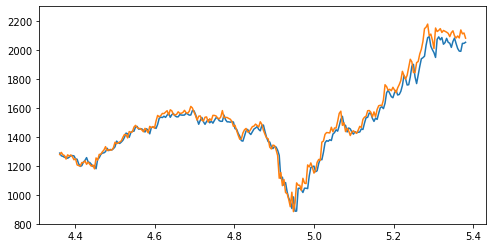

Test epoch:151 	Loss: 0.278941

Epoch: 152


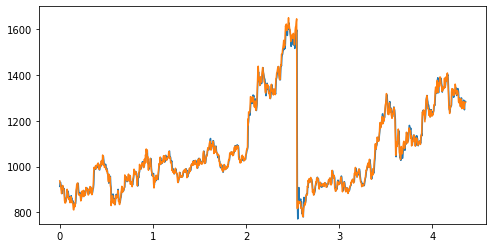

Train epoch:152 	Loss: -2.643366| Loss_in: 0.001243| Loss_out: 0.009683


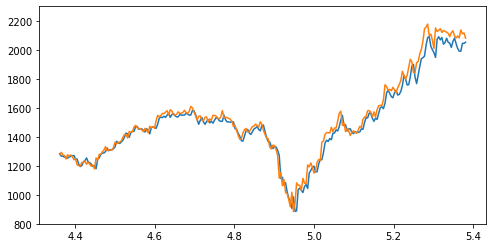

Test epoch:152 	Loss: 0.278637

Epoch: 153


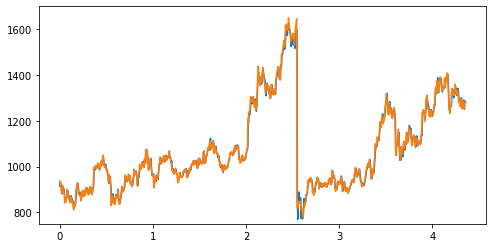

Train epoch:153 	Loss: -2.642570| Loss_in: 0.001217| Loss_out: 0.009573


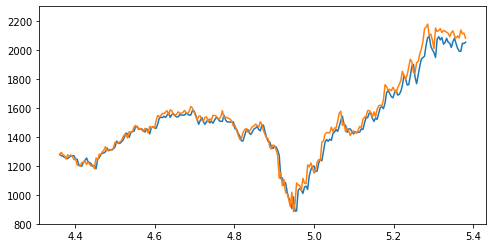

Test epoch:153 	Loss: 0.279760

Epoch: 154


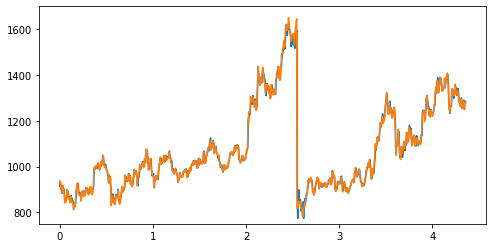

Train epoch:154 	Loss: -2.644581| Loss_in: 0.001208| Loss_out: 0.009747


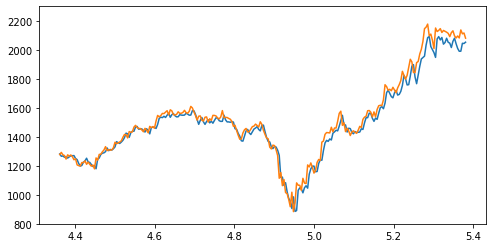

Test epoch:154 	Loss: 0.277941

Epoch: 155


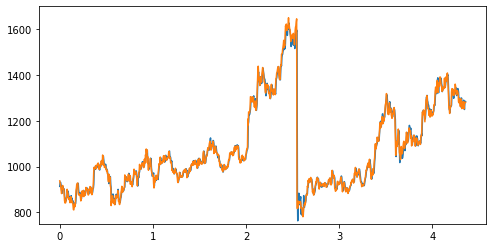

Train epoch:155 	Loss: -2.643113| Loss_in: 0.001235| Loss_out: 0.009534


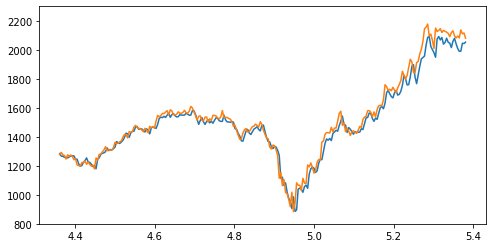

Test epoch:155 	Loss: 0.276867

Epoch: 156


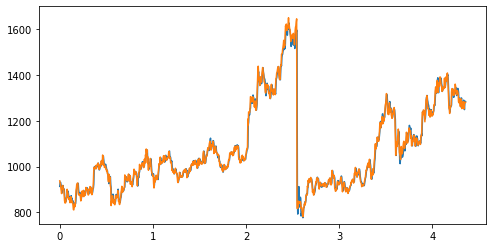

Train epoch:156 	Loss: -2.644771| Loss_in: 0.001242| Loss_out: 0.009568


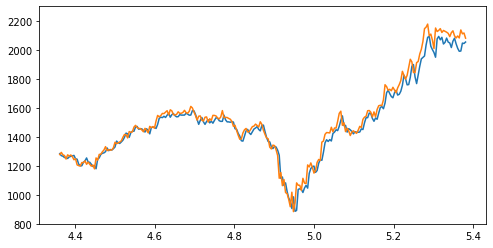

Test epoch:156 	Loss: 0.277167

Epoch: 157


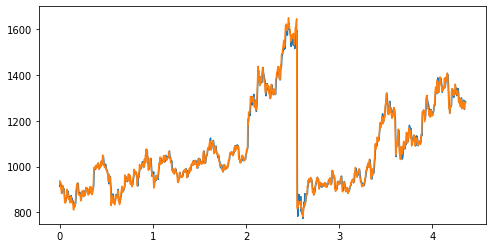

Train epoch:157 	Loss: -2.646040| Loss_in: 0.001198| Loss_out: 0.009603


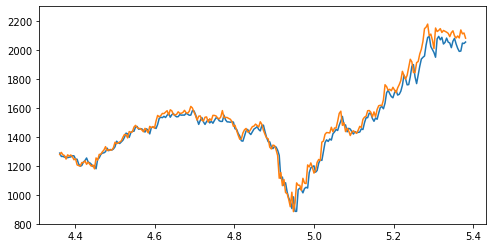

Test epoch:157 	Loss: 0.277308

Epoch: 158


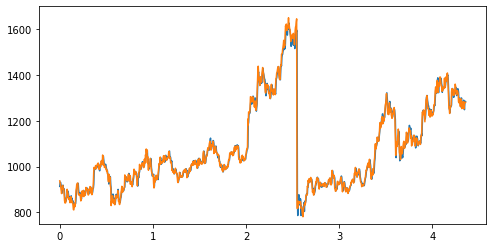

Train epoch:158 	Loss: -2.646055| Loss_in: 0.001197| Loss_out: 0.009472


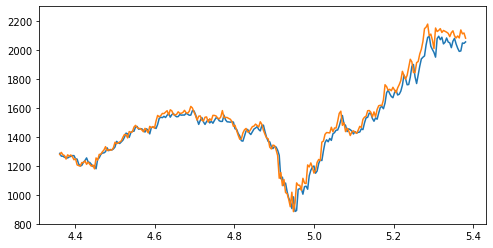

Test epoch:158 	Loss: 0.277700

Epoch: 159


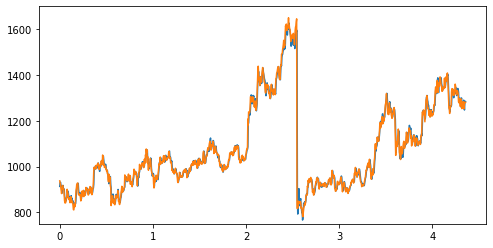

Train epoch:159 	Loss: -2.647576| Loss_in: 0.001181| Loss_out: 0.009391


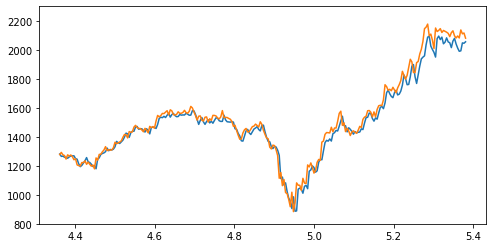

Test epoch:159 	Loss: 0.275523

Epoch: 160


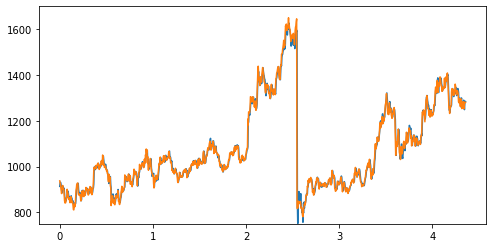

Train epoch:160 	Loss: -2.647136| Loss_in: 0.001183| Loss_out: 0.009323


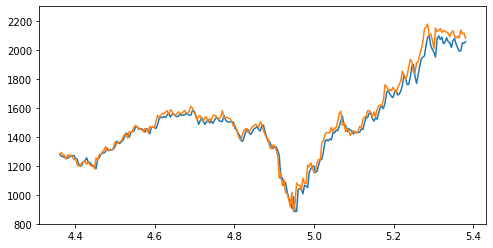

Test epoch:160 	Loss: 0.274655

Epoch: 161


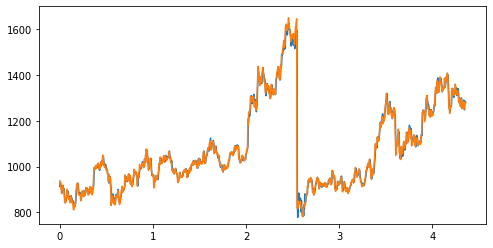

Train epoch:161 	Loss: -2.648673| Loss_in: 0.001207| Loss_out: 0.009279


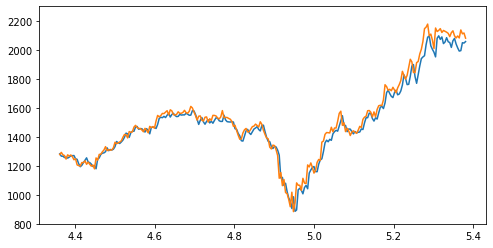

Test epoch:161 	Loss: 0.273807

Epoch: 162


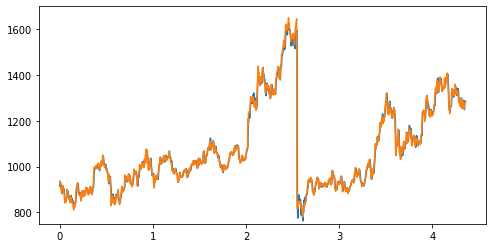

Train epoch:162 	Loss: -2.648936| Loss_in: 0.001181| Loss_out: 0.009253


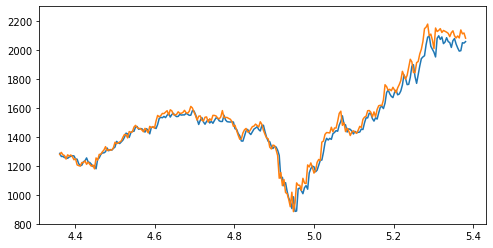

Test epoch:162 	Loss: 0.274844

Epoch: 163


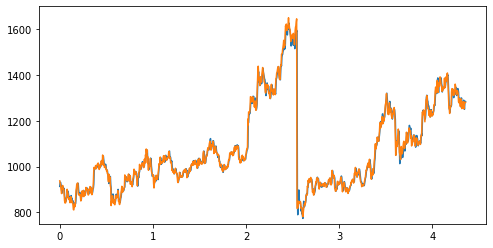

Train epoch:163 	Loss: -2.649742| Loss_in: 0.001176| Loss_out: 0.009249


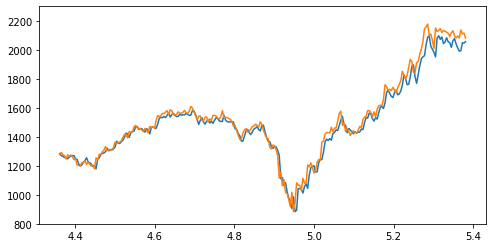

Test epoch:163 	Loss: 0.273797

Epoch: 164


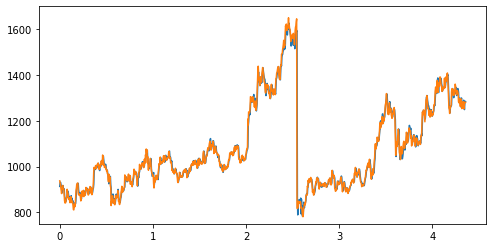

Train epoch:164 	Loss: -2.650515| Loss_in: 0.001186| Loss_out: 0.009178


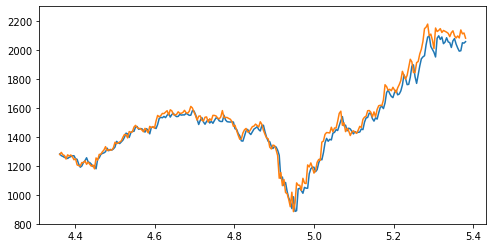

Test epoch:164 	Loss: 0.274486

Epoch: 165


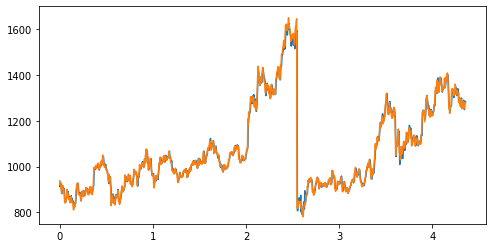

Train epoch:165 	Loss: -2.650723| Loss_in: 0.001188| Loss_out: 0.009220


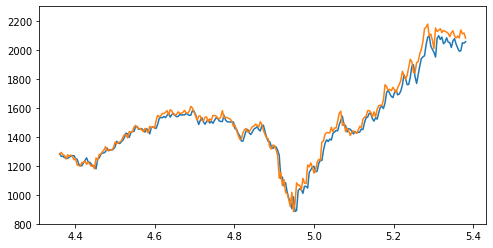

Test epoch:165 	Loss: 0.274950

Epoch: 166


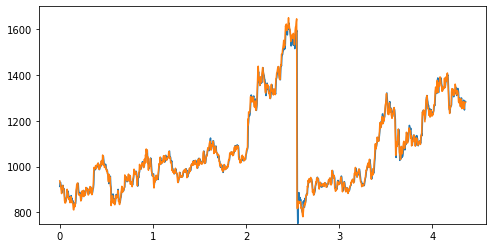

Train epoch:166 	Loss: -2.651643| Loss_in: 0.001163| Loss_out: 0.009111


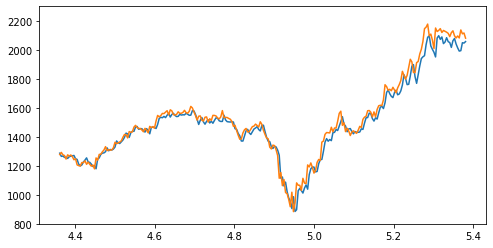

Test epoch:166 	Loss: 0.273703

Epoch: 167


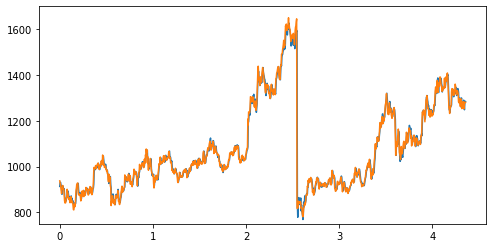

Train epoch:167 	Loss: -2.651531| Loss_in: 0.001160| Loss_out: 0.009123


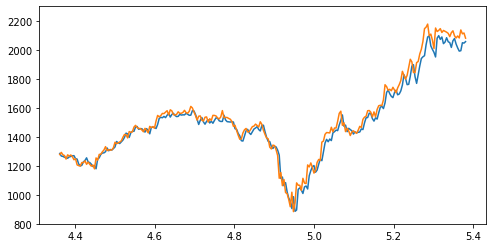

Test epoch:167 	Loss: 0.275022

Epoch: 168


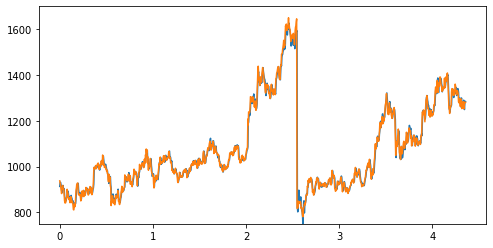

Train epoch:168 	Loss: -2.651863| Loss_in: 0.001159| Loss_out: 0.008980


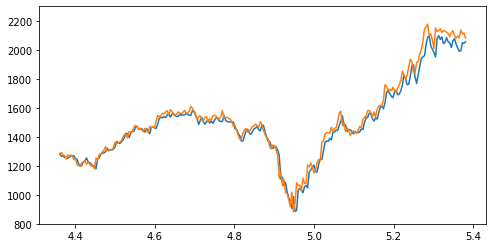

Test epoch:168 	Loss: 0.274316

Epoch: 169


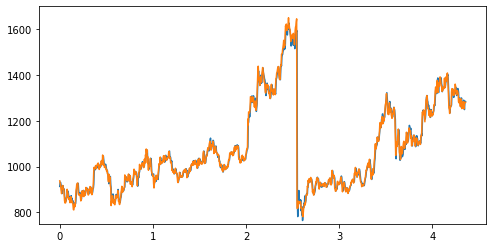

Train epoch:169 	Loss: -2.651956| Loss_in: 0.001127| Loss_out: 0.009001


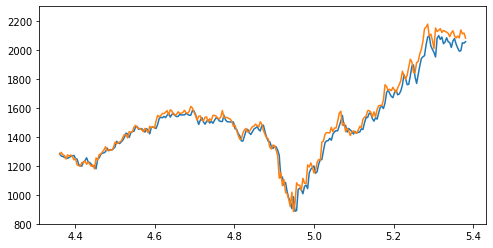

Test epoch:169 	Loss: 0.274306

Epoch: 170


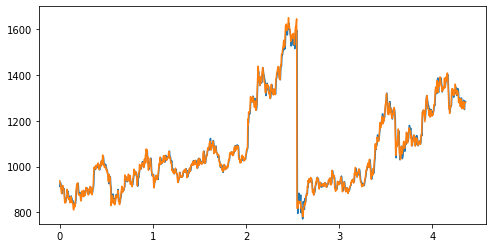

Train epoch:170 	Loss: -2.651669| Loss_in: 0.001155| Loss_out: 0.008928


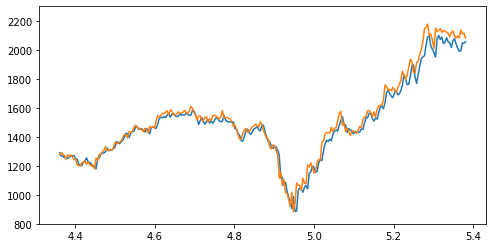

Test epoch:170 	Loss: 0.275426

Epoch: 171


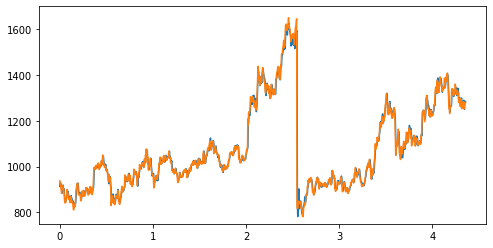

Train epoch:171 	Loss: -2.654495| Loss_in: 0.001116| Loss_out: 0.008787


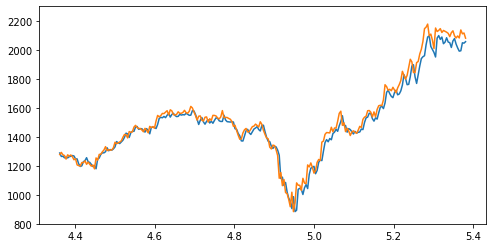

Test epoch:171 	Loss: 0.275083

Epoch: 172


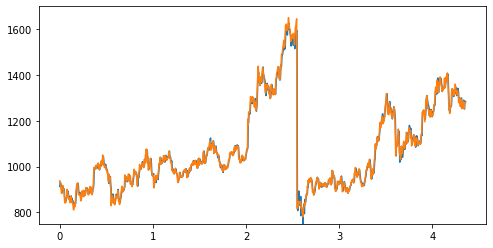

Train epoch:172 	Loss: -2.652953| Loss_in: 0.001136| Loss_out: 0.008754


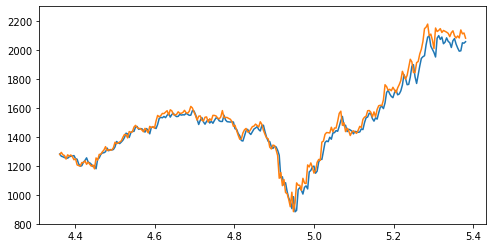

Test epoch:172 	Loss: 0.274645

Epoch: 173


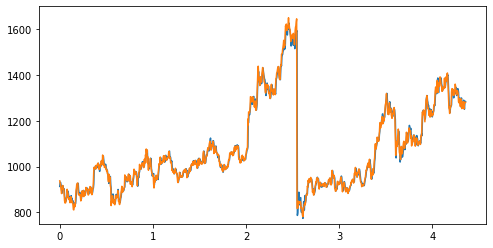

Train epoch:173 	Loss: -2.654730| Loss_in: 0.001144| Loss_out: 0.008863


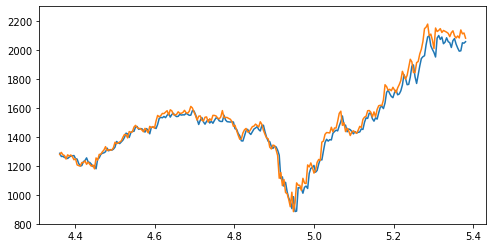

Test epoch:173 	Loss: 0.274955

Epoch: 174


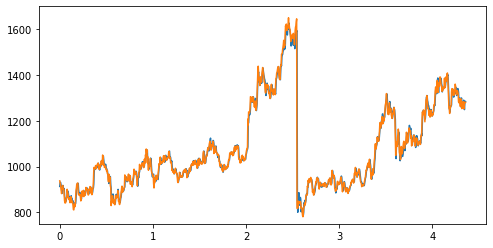

Train epoch:174 	Loss: -2.655696| Loss_in: 0.001133| Loss_out: 0.008741


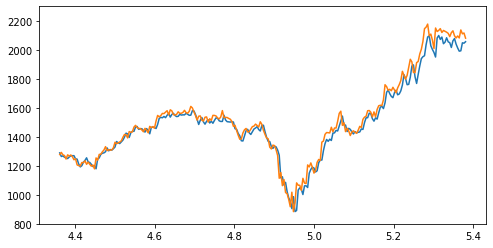

Test epoch:174 	Loss: 0.274387

Epoch: 175


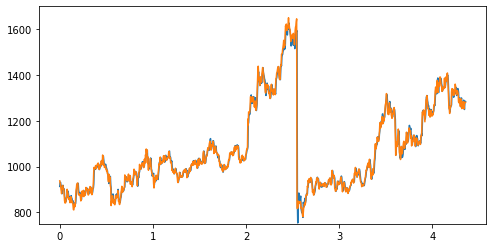

Train epoch:175 	Loss: -2.655080| Loss_in: 0.001105| Loss_out: 0.008809


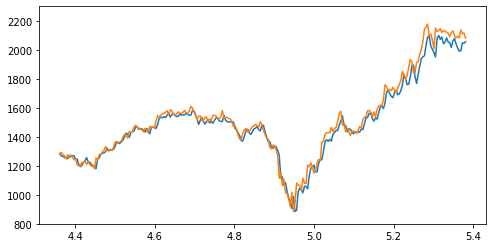

Test epoch:175 	Loss: 0.275273

Epoch: 176


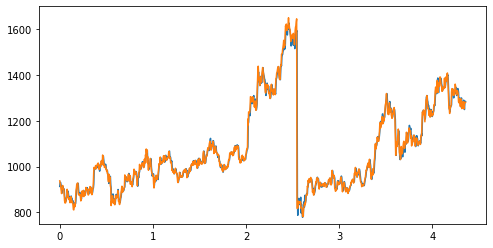

Train epoch:176 	Loss: -2.655309| Loss_in: 0.001122| Loss_out: 0.008656


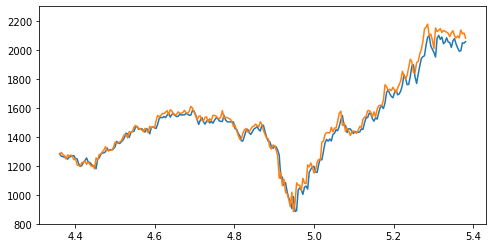

Test epoch:176 	Loss: 0.275744

Epoch: 177


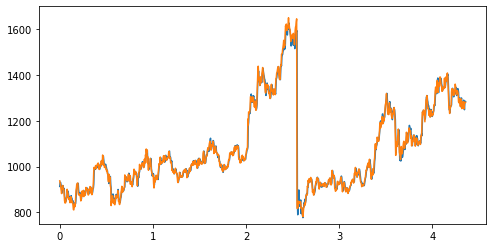

Train epoch:177 	Loss: -2.655734| Loss_in: 0.001111| Loss_out: 0.008735


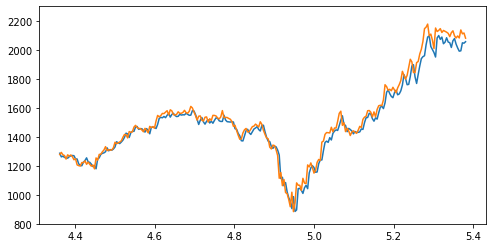

Test epoch:177 	Loss: 0.274044

Epoch: 178


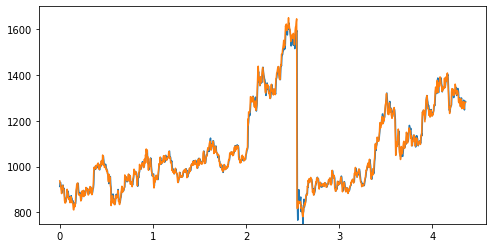

Train epoch:178 	Loss: -2.656317| Loss_in: 0.001103| Loss_out: 0.008581


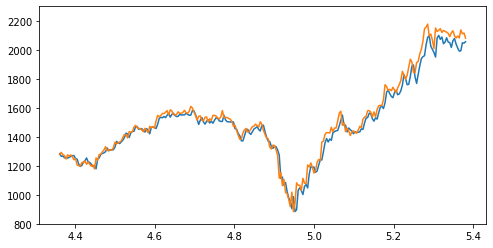

Test epoch:178 	Loss: 0.274160

Epoch: 179


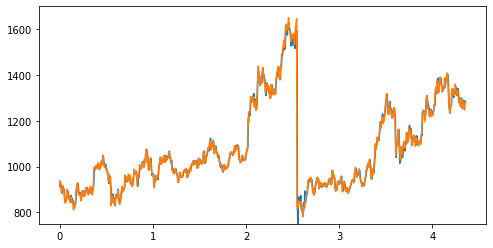

Train epoch:179 	Loss: -2.655985| Loss_in: 0.001107| Loss_out: 0.008660


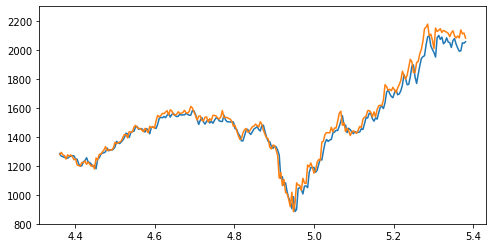

Test epoch:179 	Loss: 0.273450

Epoch: 180


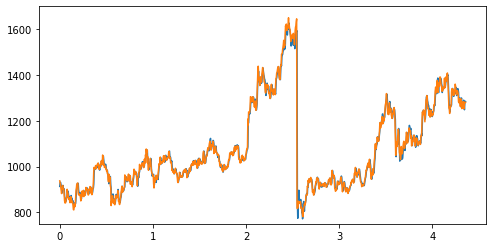

Train epoch:180 	Loss: -2.656615| Loss_in: 0.001103| Loss_out: 0.008610


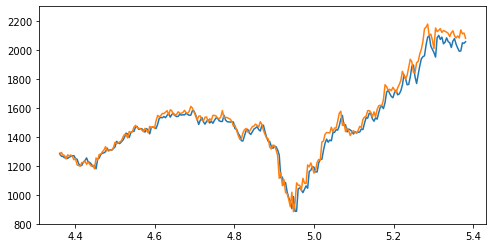

Test epoch:180 	Loss: 0.275028

Epoch: 181


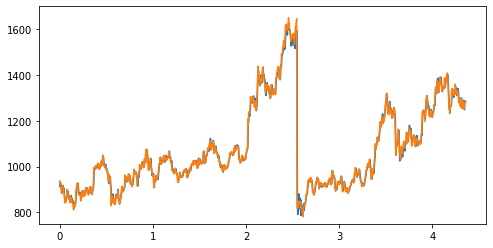

Train epoch:181 	Loss: -2.657323| Loss_in: 0.001112| Loss_out: 0.008619


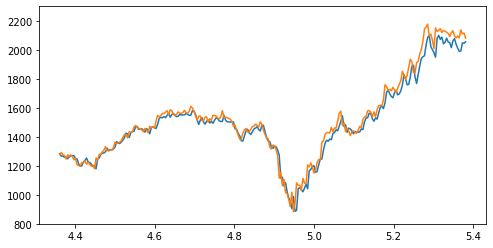

Test epoch:181 	Loss: 0.275301

Epoch: 182


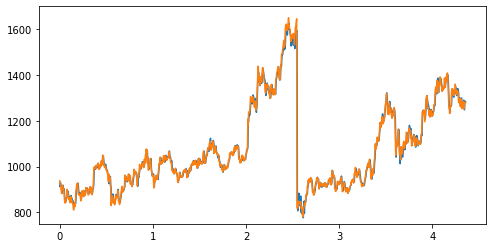

Train epoch:182 	Loss: -2.658680| Loss_in: 0.001091| Loss_out: 0.008532


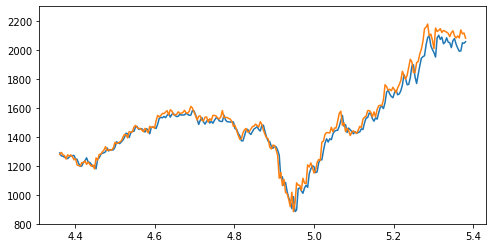

Test epoch:182 	Loss: 0.274540

Epoch: 183


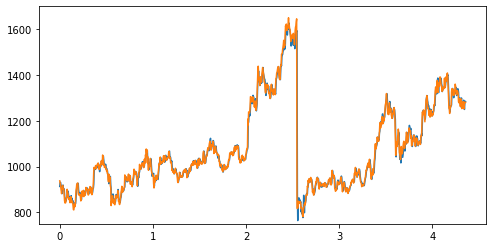

Train epoch:183 	Loss: -2.658107| Loss_in: 0.001098| Loss_out: 0.008423


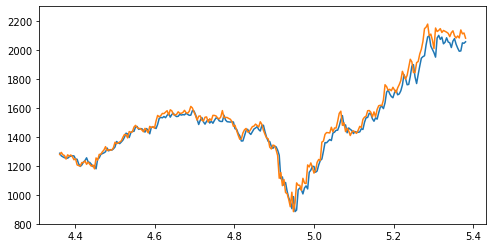

Test epoch:183 	Loss: 0.275488

Epoch: 184


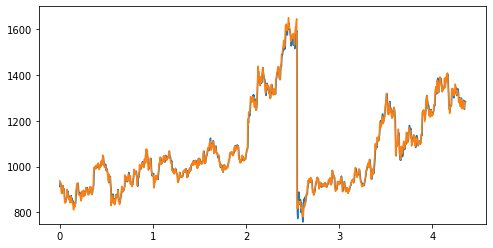

Train epoch:184 	Loss: -2.657692| Loss_in: 0.001108| Loss_out: 0.008548


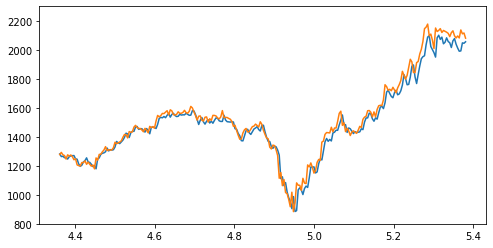

Test epoch:184 	Loss: 0.275831

Epoch: 185


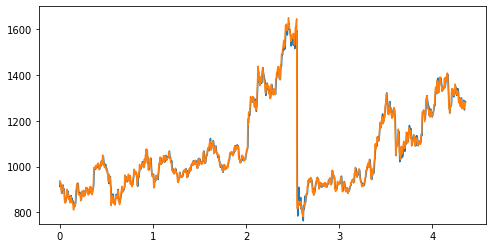

Train epoch:185 	Loss: -2.659304| Loss_in: 0.001080| Loss_out: 0.008467


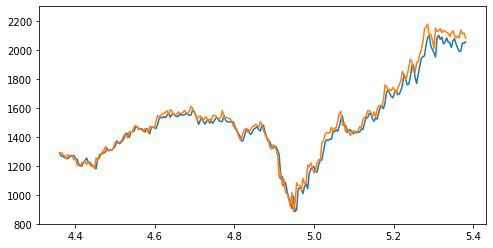

Test epoch:185 	Loss: 0.274858

Epoch: 186


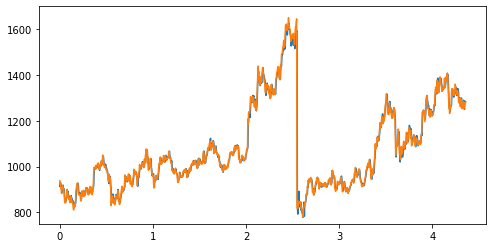

Train epoch:186 	Loss: -2.659909| Loss_in: 0.001081| Loss_out: 0.008321


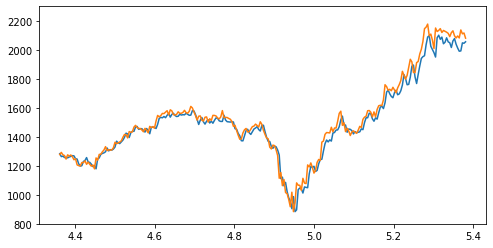

Test epoch:186 	Loss: 0.274414

Epoch: 187


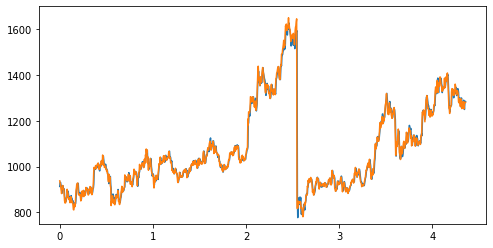

Train epoch:187 	Loss: -2.659721| Loss_in: 0.001065| Loss_out: 0.008392


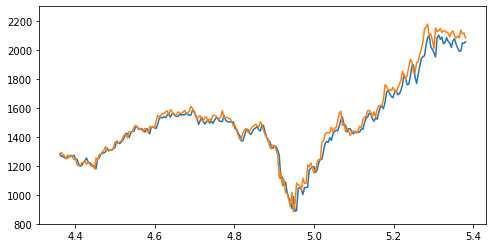

Test epoch:187 	Loss: 0.274522

Epoch: 188


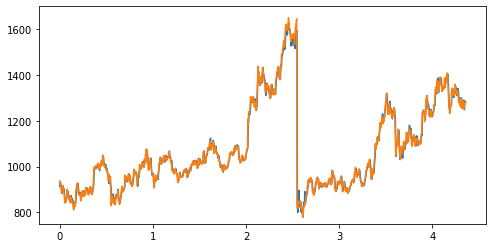

Train epoch:188 	Loss: -2.660362| Loss_in: 0.001099| Loss_out: 0.008318


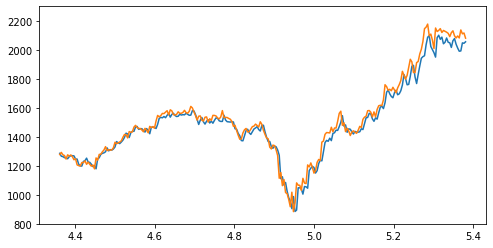

Test epoch:188 	Loss: 0.275176

Epoch: 189


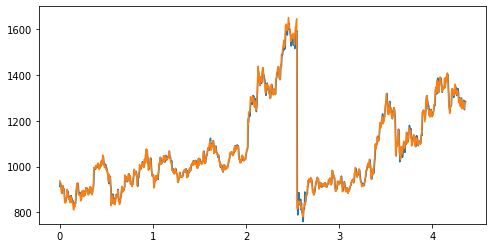

Train epoch:189 	Loss: -2.660001| Loss_in: 0.001063| Loss_out: 0.008298


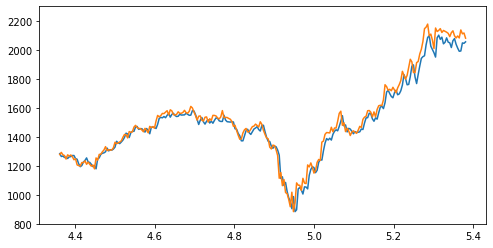

Test epoch:189 	Loss: 0.275139

Epoch: 190


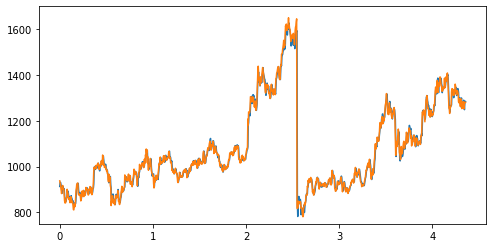

Train epoch:190 	Loss: -2.660731| Loss_in: 0.001071| Loss_out: 0.008160


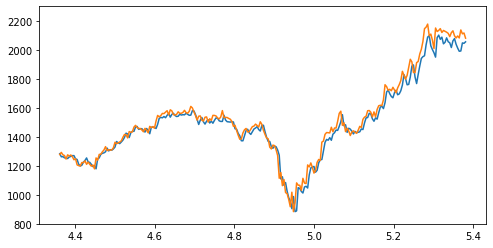

Test epoch:190 	Loss: 0.274847

Epoch: 191


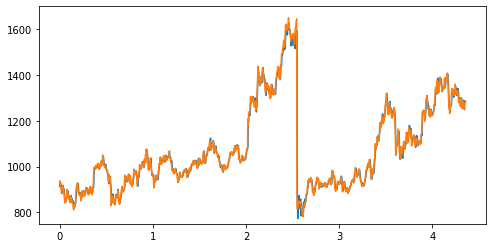

Train epoch:191 	Loss: -2.660662| Loss_in: 0.001078| Loss_out: 0.008281


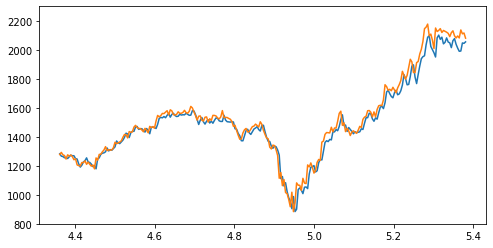

Test epoch:191 	Loss: 0.275114

Epoch: 192


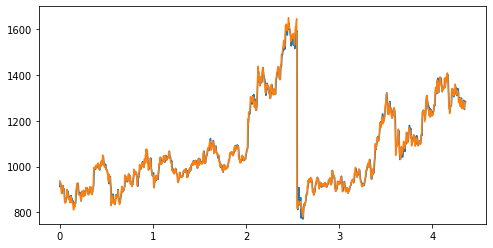

Train epoch:192 	Loss: -2.661838| Loss_in: 0.001038| Loss_out: 0.008155


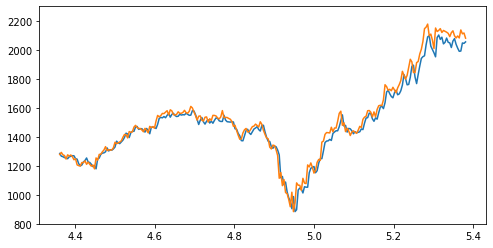

Test epoch:192 	Loss: 0.274606

Epoch: 193


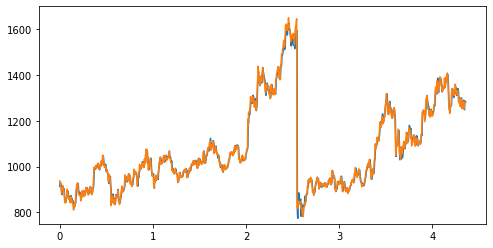

Train epoch:193 	Loss: -2.661012| Loss_in: 0.001047| Loss_out: 0.008200


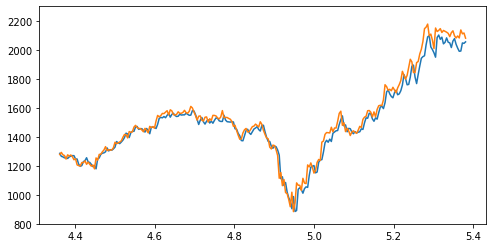

Test epoch:193 	Loss: 0.275955

Epoch: 194


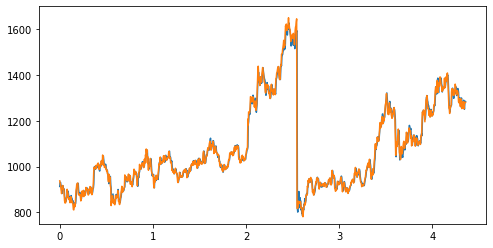

Train epoch:194 	Loss: -2.662738| Loss_in: 0.001041| Loss_out: 0.008275


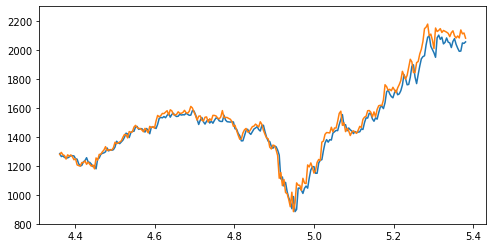

Test epoch:194 	Loss: 0.276403

Epoch: 195


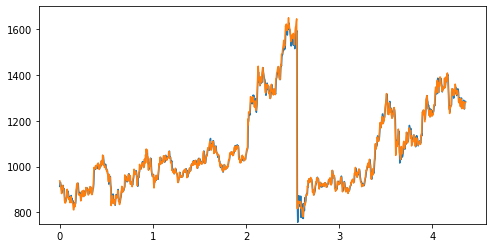

Train epoch:195 	Loss: -2.662168| Loss_in: 0.001033| Loss_out: 0.008211


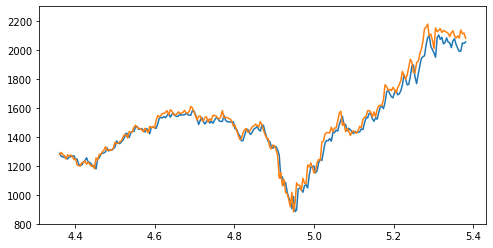

Test epoch:195 	Loss: 0.275167

Epoch: 196


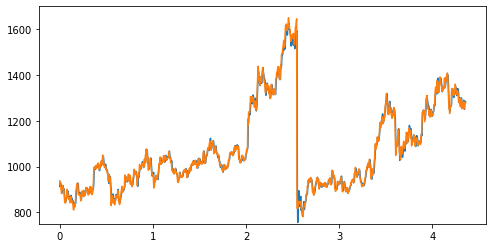

Train epoch:196 	Loss: -2.662374| Loss_in: 0.001053| Loss_out: 0.008246


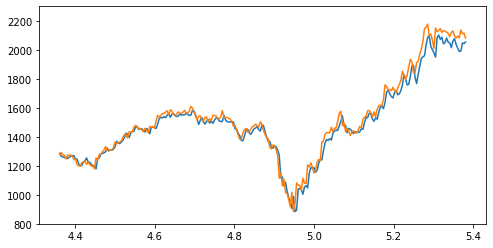

Test epoch:196 	Loss: 0.275096

Epoch: 197


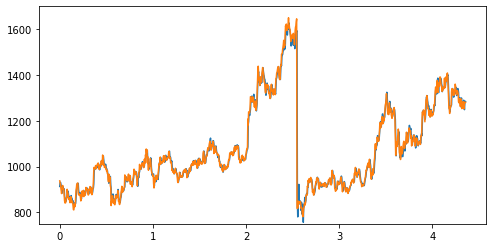

Train epoch:197 	Loss: -2.662458| Loss_in: 0.001030| Loss_out: 0.008008


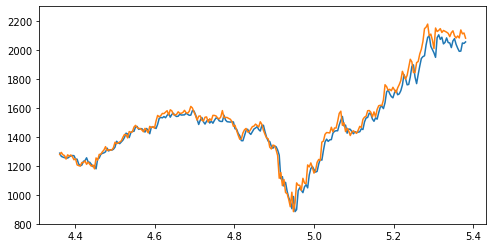

Test epoch:197 	Loss: 0.274512

Epoch: 198


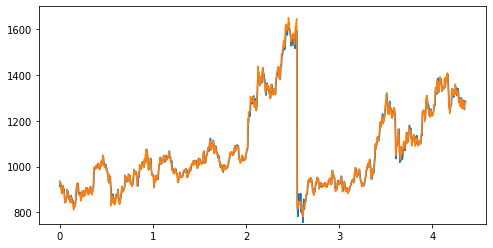

Train epoch:198 	Loss: -2.663526| Loss_in: 0.001048| Loss_out: 0.008083


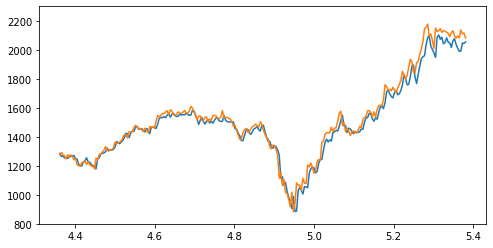

Test epoch:198 	Loss: 0.275944

Epoch: 199


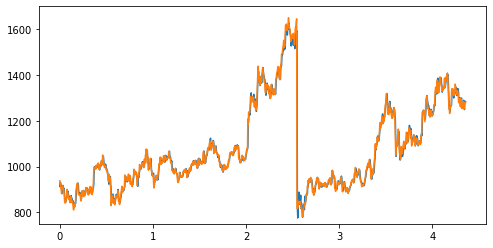

Train epoch:199 	Loss: -2.663875| Loss_in: 0.001036| Loss_out: 0.008027


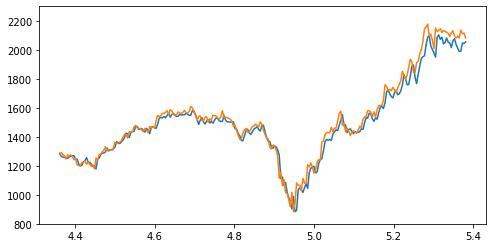

Test epoch:199 	Loss: 0.274482

Epoch: 200


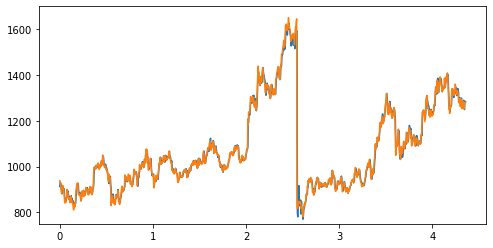

Train epoch:200 	Loss: -2.663916| Loss_in: 0.001050| Loss_out: 0.008146


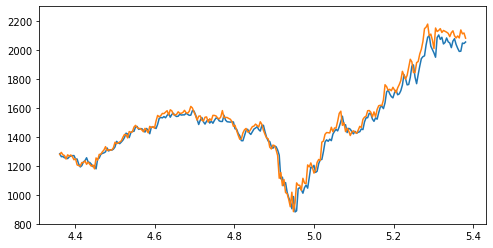

Test epoch:200 	Loss: 0.277264


In [95]:
path = os.path.join('/content/', 'output')
os.makedirs(path, exist_ok=True)
train_losses = []
test_losses = []
for epoch in range(1, args.epochs + 1):
    train_losses.append(train(epoch))
    test_losses.append(test(epoch))
    if epoch in args.decreasing_lr:
        for param_group in optimizer_F.param_groups:
            param_group['lr'] *= args.droprate

    if epoch in args.decreasing_lr2:
        for param_group in optimizer_G.param_groups:
            param_group['lr'] *= args.droprate

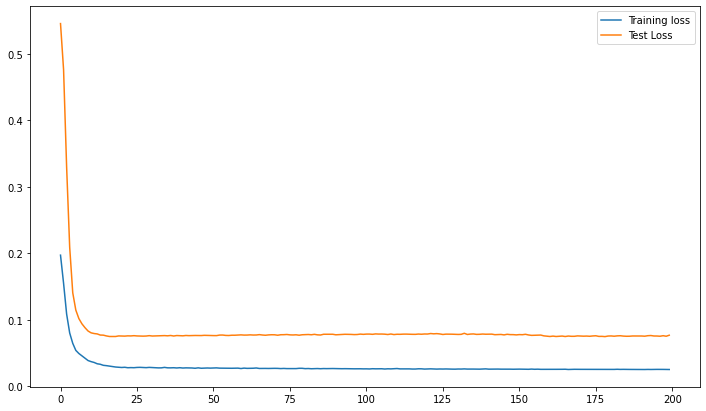

0.076875106


In [96]:
plt.figure(figsize=(12,7))
plt.plot(train_losses)
plt.plot(test_losses)
plt.legend(('Training loss','Test Loss'))
plt.savefig(os.path.join('/content/output/','Loss'), dpi=300)
plt.show()
print(test_losses[-1])

# **Download DATA**

In [ ]:
# for i in range(0,1000, 50):
#   !mv "/global_step_{i}.png" "/content/output"
# !mv "/prior.png" "/content/output"
!zip -r /content/SDE_Iteration5_MSE_.zip /content/output

files.download("/content/SDE_Iteration5_MSE_.zip")

  adding: content/output/ (stored 0%)
  adding: content/output/train_110.png (deflated 7%)
  adding: content/output/train_188.png (deflated 7%)
  adding: content/output/test_197.png (deflated 9%)
  adding: content/output/test_196.png (deflated 9%)
  adding: content/output/test_152.png (deflated 9%)
  adding: content/output/test_105.png (deflated 9%)
  adding: content/output/test_68.png (deflated 9%)
  adding: content/output/train_119.png (deflated 7%)
  adding: content/output/train_22.png (deflated 7%)
  adding: content/output/train_29.png (deflated 7%)
  adding: content/output/test_199.png (deflated 9%)
  adding: content/output/test_178.png (deflated 9%)
  adding: content/output/train_21.png (deflated 7%)
  adding: content/output/train_130.png (deflated 7%)
  adding: content/output/test_166.png (deflated 9%)
  adding: content/output/train_80.png (deflated 7%)
  adding: content/output/test_144.png (deflated 9%)
  adding: content/output/test_98.png (deflated 9%)
  adding: content/output

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

# **Delete Previous DATA**

In [97]:
!rm -rf "/content/output/"